# FIT5196 Assessment 2
#### Student Name: Adam Ginza Amanda Malik
#### Student ID: 20368925

Date: 04/10/2018

Version: 1.0

Environment: Python 3.6.4 and Jupyter notebook

Libraries used:
* pandas
* matplotlib
* numpy
* math
* time
* KNeighborsClassifier
* LinearRegression
* cross_validation
* train_test_split



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import time
# from mpl_toolkits.basemap import Basemap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split

import plotly.graph_objects as go

pd.options.mode.chained_assignment =  None

In [2]:
rad = 6378

In [3]:
df1 = pd.read_csv('20368925.csv')

In [6]:
df1.shape

(36005, 16)

In [7]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36005 entries, 0 to 36004
Data columns (total 16 columns):
Id                       35980 non-null object
Drone Type               35995 non-null float64
Post Type                35985 non-null float64
Package Weight           36005 non-null float64
Origin Region            35995 non-null float64
Destination Region       35995 non-null float64
Origin Latitude          36005 non-null float64
Origin Longitude         36005 non-null float64
Destination Latitude     36005 non-null float64
Destination Longitude    36005 non-null float64
Journey Distance         36005 non-null float64
Departure Date           36005 non-null object
Departure Time           36005 non-null object
Travel Time              35965 non-null float64
Delivery Time            36005 non-null object
Delivery Fare            35975 non-null float64
dtypes: float64(12), object(4)
memory usage: 4.4+ MB


In [8]:
df1.dtypes

Id                        object
Drone Type               float64
Post Type                float64
Package Weight           float64
Origin Region            float64
Destination Region       float64
Origin Latitude          float64
Origin Longitude         float64
Destination Latitude     float64
Destination Longitude    float64
Journey Distance         float64
Departure Date            object
Departure Time            object
Travel Time              float64
Delivery Time             object
Delivery Fare            float64
dtype: object

In [9]:
df1.head()

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare
0,ID1444984021,2.0,0.0,13.148,19.0,18.0,-38.855486,148.089969,-38.603784,146.352910,153.422,2018-02-27,03:39:42,144.48,6:04:10,133.58
1,ID5501951172,1.0,1.0,31.699,27.0,15.0,-38.675330,144.507731,-36.891363,142.780603,250.038,2018-01-28,07:10:30,245.35,11:15:50,123.61
2,ID1171009351,2.0,0.0,29.154,30.0,33.0,-38.097408,147.275392,-37.497069,143.339089,352.602,2018-06-21,09:47:35,322.85,15:10:26,127.72
3,ID1413097998,2.0,0.0,10.217,36.0,37.0,-38.439090,147.045213,-37.112349,146.463208,156.314,2018-01-19,03:42:52,147.07,6:09:56,139.24
4,ID1739660836,1.0,0.0,28.159,22.0,34.0,-37.932769,148.176283,-38.856155,146.486607,179.708,2018-05-01,20:46:46,178.37,23:45:08,93.84


In [10]:
df1.describe()

,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Travel Time,Delivery Fare
count,35995.000000,35985.000000,36005.000000,35995.000000,35995.000000,36005.000000,36005.000000,36005.000000,36005.000000,36005.000000,35965.000000,35975.000000
mean,1.703848,0.301709,23.280344,22.349354,22.582775,-37.706415,145.394628,-37.720249,145.385326,209.092588,199.712519,135.056760
std,0.780966,0.459006,10.691351,12.748243,12.691454,1.932903,7.055821,1.932247,7.064503,108.590649,100.323388,59.798833
min,1.000000,0.000000,5.000000,1.000000,1.000000,-39.006859,-148.247073,-39.006859,-148.291293,0.251000,7.460000,64.800000
25%,1.000000,0.000000,14.015000,11.000000,12.000000,-38.413494,144.229809,-38.428416,144.203805,126.326000,123.660000,106.925000
50%,2.000000,0.000000,23.191000,22.000000,23.000000,-37.730550,145.448780,-37.750904,145.430977,197.944000,188.870000,128.570000
75%,2.000000,1.000000,32.351000,33.000000,34.000000,-37.100639,146.883760,-37.115076,146.877393,278.179000,263.190000,152.460000
max,3.000000,1.000000,50.998000,44.000000,44.000000,38.806697,148.450723,38.863964,148.450723,550.660000,524.660000,1328.410000


In [11]:
df1.describe(include='O')

,Id,Departure Date,Departure Time,Delivery Time
count,35980,36005,36005,36005
unique,35945,278,29401,29398
top,ID1389293950,2018-07-23,23:30:59,9:23:15
freq,2,228,5,5


In [12]:
df1[(df1['Id'].isnull()) & (df1['Drone Type'] == 1)].head()

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare
35948,NaN,1.0,1.0,10.671,34.0,40.0,-39.006859,146.528707,-37.627593,146.041096,159.332,2018-02-13,23:56:49,158.97,2:35:47,138.63
35950,NaN,1.0,0.0,37.837,1.0,13.0,-37.375100,147.858341,-36.712578,148.326469,84.670,2018-04-28,22:06:48,87.86,23:34:39,102.80
35953,NaN,1.0,0.0,20.883,24.0,41.0,-38.023458,143.903738,-38.828010,142.843794,128.704,2018-03-21,05:01:31,129.80,7:11:19,99.36
35955,NaN,1.0,1.0,28.725,28.0,19.0,-37.680901,144.206463,-38.927180,148.271784,381.214,2018-07-27,03:27:35,370.28,9:37:51,158.43
35956,NaN,1.0,1.0,23.204,44.0,9.0,-37.557532,144.984374,-38.919773,145.196102,152.766,2018-04-06,00:47:42,152.71,3:20:24,142.30


## __Finding errors__

### 1. Null ID

#### Null IDs will be removed because it will create inconsistent dataset, and because IDs are supposed to be unique.

In [13]:
df1[df1['Id'].isnull()].shape

(25, 16)

In [14]:
df2 = df1[~df1['Id'].isnull()] # Remove Null IDs

In [15]:
df2.shape

(35980, 16)

### 2. Duplicate Rows

#### check rows that are duplicated across all columns

In [16]:
df2[df2.duplicated()].shape

(35, 16)

#### check Id is NOT null and duplicate

In [17]:
get_not_null = df2[(~df2['Id'].isnull()) & (~df2.duplicated())]

In [18]:
get_not_null[get_not_null['Id'].duplicated()]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare


#### *In summary, Ids are no longer duplicated after removing the duplicated rows. Thus the way to handle it is just to remove the duplicated rows which will automatically remove the duplicated IDs.

#### Removing rows that are duplicated across all columns, because it will cause biased analysis.

In [19]:
df3 = df2[~(df2.duplicated())]

In [20]:
df3.shape

(35945, 16)

In [21]:
df3[df3['Origin Region'].isnull()].shape

(10, 16)

### Check ORIGIN Lat Long

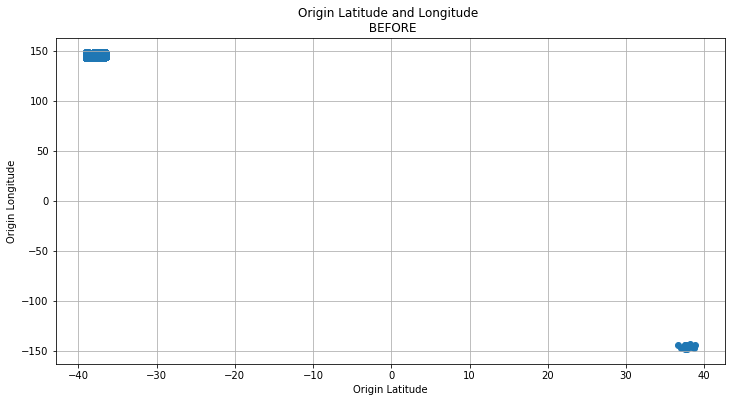

In [23]:
plt.figure(figsize=(12,6))

plt.scatter(df3['Origin Latitude'], df3['Origin Longitude'])
plt.grid()
plt.xlabel('Origin Latitude')
plt.ylabel('Origin Longitude')
plt.title('Origin Latitude and Longitude \n BEFORE')
plt.show()

### Draw map for latitude less than 30

In [24]:
lat_ori = df3[df3['Origin Latitude'] < 30]['Origin Latitude'].values
long_ori = df3[df3['Origin Latitude'] < 30]['Origin Longitude'].values

In [36]:
margin = 2 # buffer to add to the range
lat_min = min(lat_ori) - margin
lat_max = max(lat_ori) + margin
center_lat = (lat_max + lat_min) / 2

long_min = min(long_ori) - margin
long_max = max(long_ori) + margin
center_long = (long_max + long_min) / 2

In [37]:
mapbox_access_token = 'pk.eyJ1IjoiYWRhbWdpbnphIiwiYSI6ImNrNGlleHB1eTBxYTAzbW56amZtM2pqbjMifQ.08AaOBVMy9TabdjoiwXVHg'

fig = go.Figure(go.Scattermapbox(
        lat=lat_ori,
        lon=long_ori,
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=14
        )
    ))

fig.update_layout(
    hovermode='closest',
    mapbox=go.layout.Mapbox(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=go.layout.mapbox.Center(
            lat= center_lat,
            lon= center_long
        )
        , zoom= 4
    )
)

fig.show()

#### From above map, it can be seen that Origin Latitude < 30 is scattered around Victoria area. Thus, we fix the Origin Latitude and Origin Longitude which have Origin Latitude > 30 by multiplying $-1$ for Origin Latitude and Origin Longitude

In [38]:
# lambda x: True if x % 2 == 0 else False
df4 = df3.copy()

In [39]:
df4['Origin Longitude'] = df4.apply(lambda row: row['Origin Longitude']*-1 if row['Origin Latitude'] > 30 else row['Origin Longitude'], axis=1)

In [40]:
df4['Origin Latitude'] = df4['Origin Latitude'].apply(lambda row: row*-1 if row > 30 else row)

#### Check for Latitude > 30

In [41]:
df4[df4['Origin Latitude'] > 30]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare


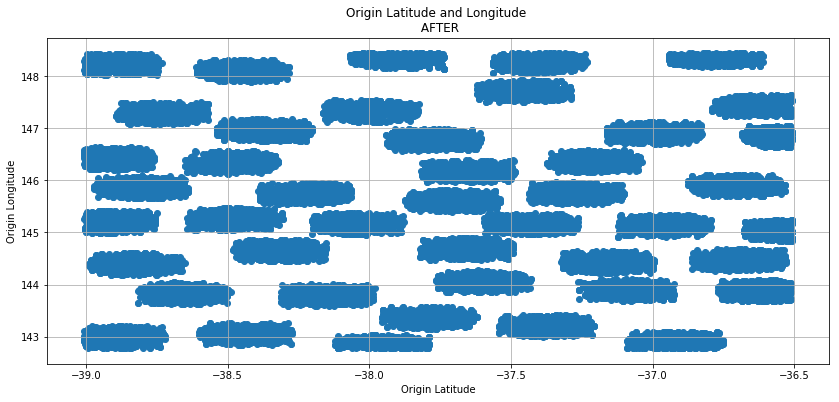

In [42]:
plt.figure(figsize=(14,6))

origin_region = df4[~df4['Origin Region'].isnull()]['Origin Region'].unique().tolist()
origin_region.sort()

plt.scatter(df4['Origin Latitude'], df4['Origin Longitude'])
plt.grid()
plt.xlabel('Origin Latitude')
plt.ylabel('Origin Longitude')
plt.title('Origin Latitude and Longitude \n AFTER')

plt.show()

### Check Result on Map After Fixing the Origin Lat Long

In [43]:
# GET ALL ORIGIN LATITUDE AND LONGITUDE VALUES

lat_ori_new = df4['Origin Latitude'].values
long_ori_new = df4['Origin Longitude'].values

In [44]:
margin = 2 # buffer to add to the range
lat_min_new = min(lat_ori_new) - margin
lat_max_new = max(lat_ori_new) + margin
center_lat_new = (lat_max_new + lat_min_new) / 2

long_min_new = min(long_ori_new) - margin
long_max_new = max(long_ori_new) + margin
center_long_new = (long_max_new + long_min_new) / 2

In [47]:
fig = go.Figure(go.Scattermapbox(
        lat=lat_ori_new,
        lon=long_ori_new,
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=14
        )
    ))

fig.update_layout(
    hovermode='closest',
    mapbox=go.layout.Mapbox(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=go.layout.mapbox.Center(
            lat= center_lat_new,
            lon= center_long_new
        )
        , zoom= 6
    )
)

fig.show()

### Check DESTINATION Lat Long

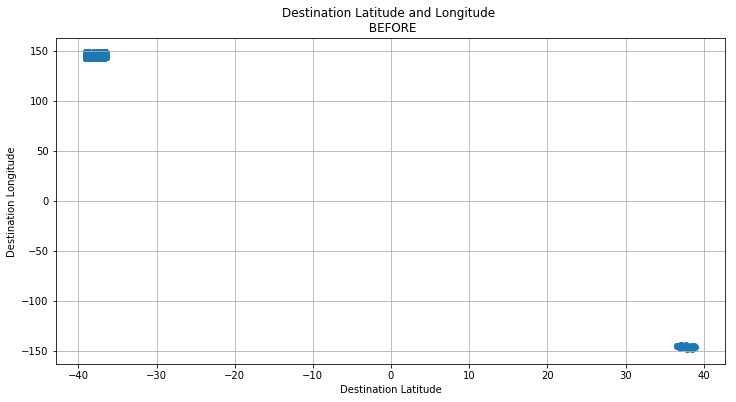

In [48]:
plt.figure(figsize=(12,6))
plt.scatter(df4['Destination Latitude'], df4['Destination Longitude'])
plt.grid()
plt.xlabel('Destination Latitude')
plt.ylabel('Destination Longitude')
plt.title('Destination Latitude and Longitude \n BEFORE')
plt.show()

In [49]:
lat_dest = df4[df4['Destination Latitude'] > 30]['Destination Latitude'].values
long_dest = df4[df4['Destination Latitude'] > 30]['Destination Longitude'].values

In [51]:
margin = 35 # buffer to add to the range
lat_min_dest = min(lat_dest) - margin
lat_max_dest = max(lat_dest) + margin
center_lat_dest = (lat_min_dest + lat_max_dest) / 2

long_min_dest = min(long_dest) - margin
long_max_dest = max(long_dest) + margin
center_long_dest = (long_min_dest + long_max_dest) / 2

In [54]:
fig = go.Figure(go.Scattermapbox(
        lat=lat_dest,
        lon=long_dest,
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=14
        )
    ))

fig.update_layout(
    title = 'Destinations with Latitude > 30',
    hovermode='closest',
    mapbox=go.layout.Mapbox(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=go.layout.mapbox.Center(
            lat= center_lat_dest,
            lon= center_long_dest
        )
        , zoom= 3
    )
)

fig.show()

#### If destination latitude > 30, the location is in the middle of the ocean, thus concluding that the correct Destination LatLong are the ones with destination latitude < 30.

In [55]:
lat_dest = df4[df4['Destination Latitude'] < 30]['Destination Latitude'].values
long_dest = df4[df4['Destination Latitude'] < 30]['Destination Longitude'].values

In [57]:
margin = 10 # buffer to add to the range
lat_min_dest = min(lat_dest) - margin
lat_max_dest = max(lat_dest) + margin
center_lat_dest = (lat_min_dest + lat_max_dest) / 2

long_min_dest = min(long_dest) - margin
long_max_dest = max(long_dest) + margin
center_long_dest = (long_min_dest + long_max_dest) / 2

In [58]:
fig = go.Figure(go.Scattermapbox(
        lat=lat_dest,
        lon=long_dest,
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=14
        )
    ))

fig.update_layout(
    title = 'Destinations with Latitude < 30',
    hovermode='closest',
    mapbox=go.layout.Mapbox(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=go.layout.mapbox.Center(
            lat= center_lat_dest,
            lon= center_long_dest
        )
        , zoom= 3
    )
)

fig.show()

In [59]:
# lambda x: True if x % 2 == 0 else False
df5 = df4.copy()

In [60]:
df5['Destination Longitude'] = df5.apply(lambda row: row['Destination Longitude']*-1 if row['Destination Latitude'] > 30 else row['Destination Longitude'], axis=1)

In [61]:
df5['Destination Latitude'] = df5['Destination Latitude'].apply(lambda row: row*-1 if row > 30 else row)

#### Check again for Destination Latitude > 30

In [62]:
df5[df5['Destination Latitude'] > 30]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare


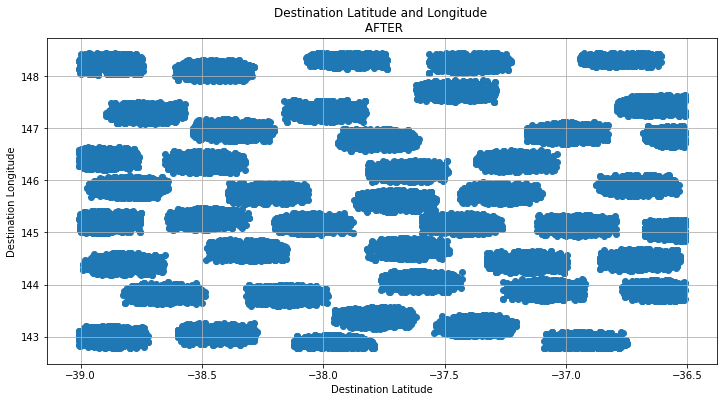

In [63]:
plt.figure(figsize=(12,6))

plt.scatter(df5['Destination Latitude'], df5['Destination Longitude'])
plt.grid()
plt.xlabel('Destination Latitude')
plt.ylabel('Destination Longitude')
plt.title('Destination Latitude and Longitude \n AFTER')

plt.show()

#### For Origin Latitude, Origin Longitude, Destination Latitude, Destination Longitude, they have been fixed to the right coordinates which are supposed to be scattered around Victoria area.

## FIXING REGION

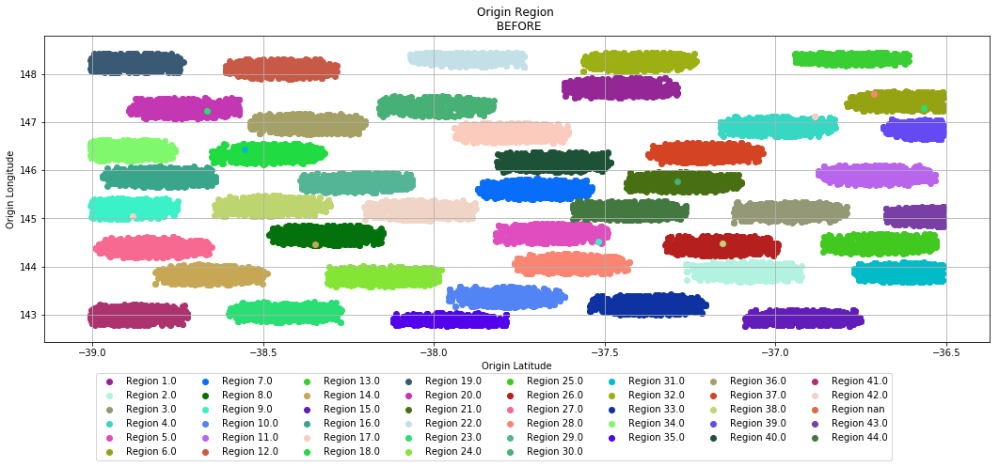

In [293]:
plt.figure(figsize=(18,6))

origin_region = df5['Origin Region'].unique().tolist()
origin_region.sort()

for i in origin_region:
    plt.scatter(df5[df5['Origin Region'] == i]['Origin Latitude'], df5[df5['Origin Region'] == i]['Origin Longitude'],\
                c=np.random.rand(3,), \
               label = 'Region {}'.format(i))

plt.grid()
plt.xlabel('Origin Latitude')
plt.ylabel('Origin Longitude')
plt.title('Origin Region \n BEFORE')
plt.legend(loc = 'lower left', ncol=8, bbox_to_anchor=(0.05, -0.4))
# plt.colorbar(use_gridspec= True)
plt.show()

#### From the above plot, there are points that are not in the right place which are indicated by a different color in a pile of a same color. For this problem, it is best to fix the region instead of fixing the LatLong, and to fix the incorrect point, we use the K-Nearest Neighbors to identify the closest region from the ones that are misplaced.

## Define function to get distance

In [294]:
def get_distance(lat_ori, long_ori, lat_dest, long_dest):

    lat_ori = math.radians(lat_ori)
    long_ori = math.radians(long_ori)

    lat_dest = math.radians(lat_dest)
    long_dest = math.radians(long_dest)
    
    dlat = lat_dest - lat_ori
    dlong = long_dest - long_ori
    
    a = ((math.sin(dlat/2))**2) + (math.cos(lat_ori) * math.cos(lat_dest) * ((math.sin(dlong/2))**2))
    c = 2 * math.atan2( math.sqrt(a), math.sqrt(1-a) )
    d = rad * c
    
    return d

#### To see whether there are origin regions that are not in the right place, let's check a few sample of regions

##### Testing for origin == 1.0

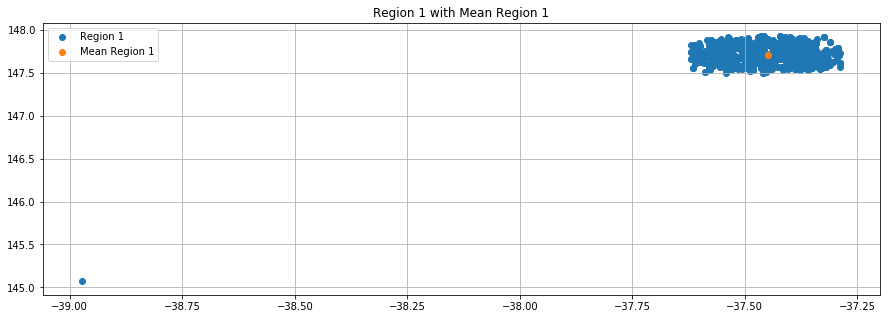

In [295]:
plt.figure(figsize = (15,5))
plt.scatter(df5[df5['Origin Region'] == 1.0]['Origin Latitude'], df5[df5['Origin Region'] == 1.0]['Origin Longitude'],\
           label = 'Region 1')

mean_lat = df5[df5['Origin Region'] == 1.0]['Origin Latitude'].mean()
mean_long = df5[df5['Origin Region'] == 1.0]['Origin Longitude'].mean()

plt.scatter(mean_lat, mean_long, label = 'Mean Region 1')

plt.legend()
plt.grid()
plt.title('Region 1 with Mean Region 1')
plt.show()

It can be seen that there is one LatLong point on the bottom left corner that does not belong in the right region.

##### Testing for Origin Region == 2.0

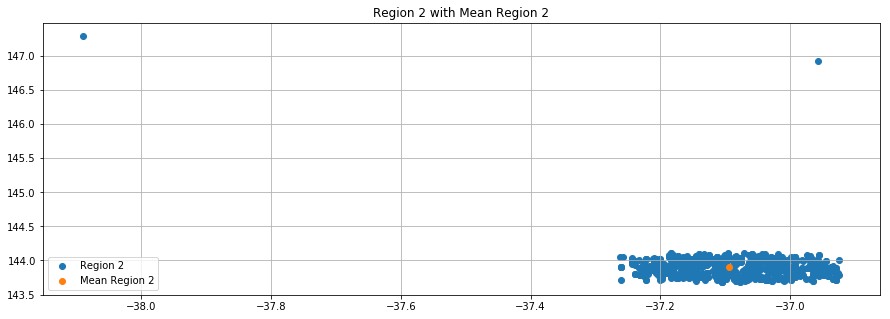

In [296]:
plt.figure(figsize = (15,5))
plt.scatter(df5[df5['Origin Region'] == 2.0]['Origin Latitude'], df5[df5['Origin Region'] == 2.0]['Origin Longitude'],\
           label = 'Region 2')

mean_lat = df5[df5['Origin Region'] == 2.0]['Origin Latitude'].mean()
mean_long = df5[df5['Origin Region'] == 2.0]['Origin Longitude'].mean()

plt.scatter(mean_lat, mean_long, label = 'Mean Region 2')

plt.legend(loc = 'lower left')
plt.grid()
plt.title('Region 2 with Mean Region 2')
plt.show()

For Origin Region == 2.0, there are even 2 points that are not supposed to be in Origin Region 2.0

### For those points that are not in the correct region, we can categorize them as outliers in respect to that region. To fix those outliers, first we find the mean Latitude and Longitude for every region and then calculate the distance from the mean to the other points, that way there will be obvious points that are considered as outliers.

#### Create a Dictionary containing mean Lat and Long for every Region

In [297]:
test_flag_outlier = df5.copy()

tfo_dict = {}

tfo_region = test_flag_outlier[~test_flag_outlier['Origin Region'].isnull()]['Origin Region'].unique()
tfo_region.sort()

for i in tfo_region:
    tfo_dict[i] = [test_flag_outlier[test_flag_outlier['Origin Region'] == i]['Origin Latitude'].mean() ,
                    test_flag_outlier[test_flag_outlier['Origin Region'] == i]['Origin Longitude'].mean()]



In [298]:
print(tfo_dict)

{1.0: [-37.4494199472895, 147.71394275294116], 2.0: [-37.09342838600723, 143.90702588612785], 3.0: [-36.958252442183905, 145.1322915294253], 4.0: [-37.000899486894916, 146.91302490897283], 5.0: [-37.65382895183867, 144.695389660261], 6.0: [-36.634677091547616, 147.43695193583332], 7.0: [-37.70103961370679, 145.60217669368296], 8.0: [-38.31400135285714, 144.65212864440477], 9.0: [-38.893409944518716, 145.2012752406417], 10.0: [-37.79837232685643, 143.368674775], 11.0: [-36.70381368806334, 145.90668168952496], 12.0: [-38.449556509124996, 148.11316258375], 13.0: [-36.7680809465311, 148.33588873875598], 14.0: [-38.65612230363196, 143.83254491864406], 15.0: [-36.916975368009766, 142.93071873711844], 16.0: [-38.80031411325, 145.869149888875], 17.0: [-37.77297621050633, 146.78550905367086], 18.0: [-38.4777458647482, 146.34388310179855], 19.0: [-38.87834663442623, 148.2302638183841], 20.0: [-38.73117767310087, 147.28709151942715], 21.0: [-37.26972630661765, 145.7511242897059], 22.0: [-37.89543

In [299]:
# Applying mean Lat and mean Long for every Origin Region
test_flag_outlier['mean_lat'] = test_flag_outlier.apply(lambda row: None if np.isnan(row['Origin Region']) else tfo_dict[row['Origin Region']][0], axis =1 )
test_flag_outlier['mean_long'] = test_flag_outlier.apply(lambda row: None if np.isnan(row['Origin Region']) else tfo_dict[row['Origin Region']][1], axis =1 )

# Calculate distance from mean_lat, mean_long to Origin Latitude, Origin Longitude
test_flag_outlier['distance_outlier'] = test_flag_outlier.apply(lambda row:
                                                            None if np.isnan(row['Origin Region'])
                                                            else
                                                            get_distance(row['mean_lat'], 
                                                                         row['mean_long'], 
                                                                         row['Origin Latitude'], 
                                                                         row['Origin Longitude']
                                                                        ) 
                                                           ,axis = 1)

#### At this point, there are 2 main problems in Origin Region column, the first one is the null values, and the other is the outlier values. In order to fix these problems, we can categorize both problem as outlier values by setting the Origin Region values to a significant value, for example 999.0.

##### Checking for null Origin Region

In [300]:
test_flag_outlier[test_flag_outlier['Origin Region'].isnull()].shape

(10, 19)

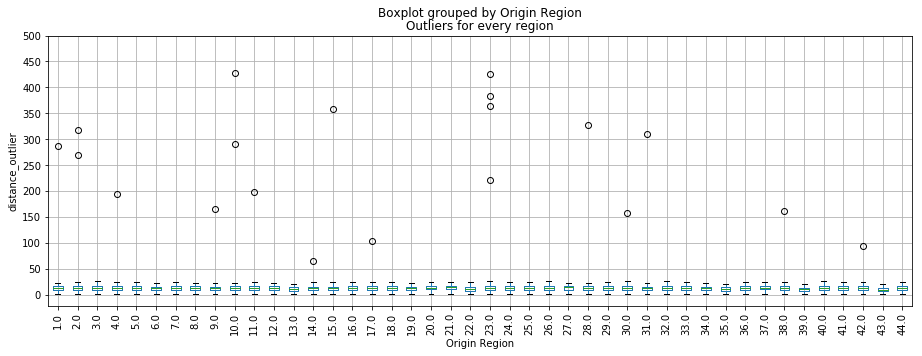

In [301]:
tfo_B = test_flag_outlier.boxplot(column = 'distance_outlier', by='Origin Region', rot=90, figsize=(15,5))
plt.title('Outliers for every region')
plt.yticks([0,50,100,150,200,250,300,350,400,450,500])
plt.ylabel('distance_outlier')
plt.show()

From the above boxplot, it can be seen that the outliers are the ones with __distance_outlier > 50__. Thus, we combine outliers with the null values by making them NaN.

In [302]:
test_flag_outlier['Origin Region'] = test_flag_outlier.apply(lambda row:np.nan if row['distance_outlier'] > 50 else row['Origin Region'],axis = 1)

After combining outliers with the null values, check for total null values in Origin Region.

In [303]:
test_flag_outlier[test_flag_outlier['Origin Region'].isnull()].shape

(30, 19)

#### Making a prediction for null values of origin region using k-nearest neighbors.

In [304]:
neighbors = KNeighborsClassifier()

In [305]:
test_flag_outlier['Origin Region'].fillna(value = 999.0, inplace=True) # fill null values with significantly high value

# fit the Origin Latitude and Origin Longitude against Origin Region
neighbors.fit(test_flag_outlier.iloc[:,6:8], test_flag_outlier['Origin Region'])

# apply prediction on Origin Region = 999.0
test_flag_outlier['Origin Region'] = test_flag_outlier.apply(lambda row: 
                                                             neighbors.predict([row[['Origin Latitude', 'Origin Longitude']]])
                                                             if row['Origin Region'] == 999.0
                                                             else
                                                             row['Origin Region']
                                                             ,axis = 1)

test_flag_outlier['Origin Region'] = test_flag_outlier['Origin Region'].astype(float)

#### Before applying prediction, the Origin Region is NaN

In [306]:
df5[df5.index == 23]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare
23,ID1897300127,1.0,0.0,29.2,NaN,40.0,-37.746564,144.074912,-37.742008,146.12553,180.501,2018-01-09,02:21:08,179.13,5:20:15,110.11


#### After applying prediction

In [307]:
test_flag_outlier[test_flag_outlier.index == 23]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare,mean_lat,mean_long,distance_outlier
23,ID1897300127,1.0,0.0,29.2,28.0,40.0,-37.746564,144.074912,-37.742008,146.12553,180.501,2018-01-09,02:21:08,179.13,5:20:15,110.11,NaN,NaN,NaN


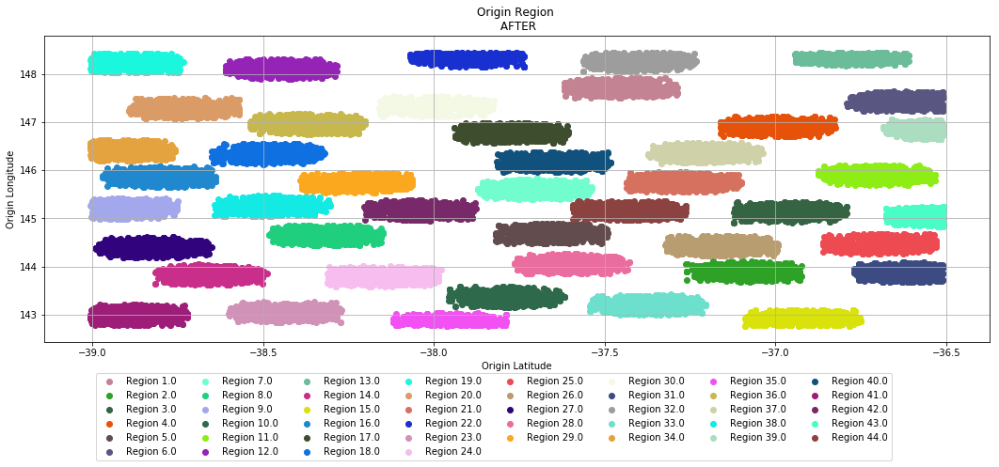

In [308]:
plt.figure(figsize=(18,6))

origin_region = test_flag_outlier['Origin Region'].unique().tolist()
origin_region.sort()

for i in origin_region:
    plt.scatter(test_flag_outlier[test_flag_outlier['Origin Region'] == i]['Origin Latitude'], test_flag_outlier[test_flag_outlier['Origin Region'] == i]['Origin Longitude'],\
                c=np.random.rand(3,), \
               label = 'Region {}'.format(i))

plt.grid()
plt.xlabel('Origin Latitude')
plt.ylabel('Origin Longitude')
plt.title('Origin Region \n AFTER')
plt.legend(loc = 'lower left', ncol=8, bbox_to_anchor=(0.05, -0.4))
# plt.colorbar(use_gridspec= True)
plt.show()

#### From the above plot, it can be concluded that there are no more misplaced region. Hence, the Origin Region data has been cleaned.

### To fix The destination Region, we do the same process as been done in the previous process to fix origin Region.

In [309]:
df6 = test_flag_outlier.copy()

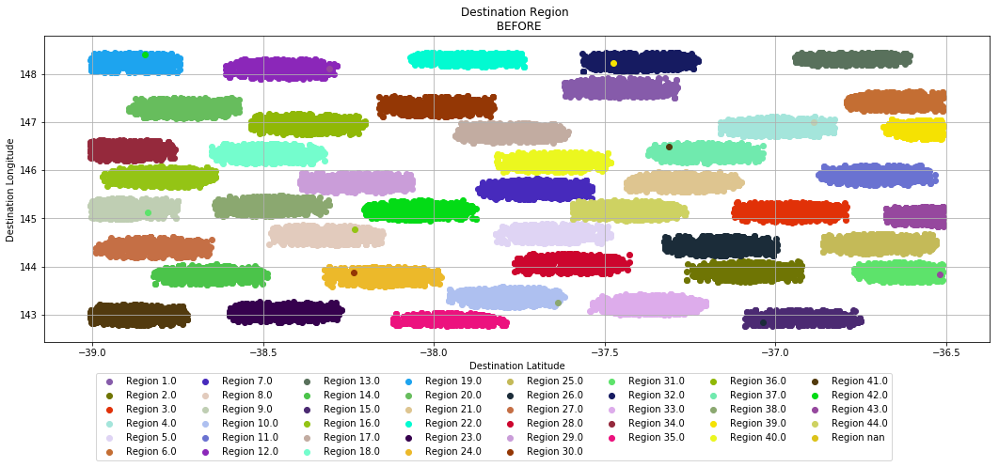

In [310]:
plt.figure(figsize=(18,6))

origin_region = df6['Destination Region'].unique().tolist()
origin_region.sort()

for i in origin_region:
    plt.scatter(df6[df6['Destination Region'] == i]['Destination Latitude'], df6[df6['Destination Region'] == i]['Destination Longitude'],\
                c=np.random.rand(3,), \
               label = 'Region {}'.format(i))

plt.grid()
plt.xlabel('Destination Latitude')
plt.ylabel('Destination Longitude')
plt.title('Destination Region \n BEFORE')
plt.legend(loc = 'lower left', ncol=8, bbox_to_anchor=(0.05, -0.4))

plt.show()

In [311]:
destination_dict = {}

destination_region = df6[~df6['Destination Region'].isnull()]['Destination Region'].unique()
destination_region.sort()

for i in destination_region:
    destination_dict[i] = [df6[df6['Destination Region'] == i]['Destination Latitude'].mean() ,
                    df6[df6['Destination Region'] == i]['Destination Longitude'].mean()]



In [312]:
print(destination_dict)

{1.0: [-37.45259235268818, 147.70990351565112], 2.0: [-37.09097694629405, 143.89603476585663], 3.0: [-36.95529206122195, 145.13817833104738], 4.0: [-37.00362650222497, 146.90749473473423], 5.0: [-37.64897111461126, 144.68952682493298], 6.0: [-36.64397445445293, 147.43302264109414], 7.0: [-37.70174416955991, 145.61218339828852], 8.0: [-38.31284722828536, 144.6490482534418], 9.0: [-38.88886896542056, 145.20348601016354], 10.0: [-37.79391018205431, 143.35761740956315], 11.0: [-36.70529148171779, 145.91084298539877], 12.0: [-38.449527724375, 148.118897081], 13.0: [-36.76561929220624, 148.32738453177458], 14.0: [-38.65956614336735, 143.8307411086735], 15.0: [-36.92177698005083, 142.92081746543838], 16.0: [-38.80266315313653, 145.86292234280444], 17.0: [-37.77648274246753, 146.7776386948052], 18.0: [-38.486793273684206, 146.3484398777512], 19.0: [-38.87976252481203, 148.22992680150375], 20.0: [-38.7278608971864, 147.28962276318876], 21.0: [-37.26999020601227, 145.74170317730062], 22.0: [-37.

In [313]:
# Applying mean Lat and mean Long for every Destination Region
df6['mean_lat_dest'] = df6.apply(lambda row: None if np.isnan(row['Destination Region']) else destination_dict[row['Destination Region']][0], axis =1 )
df6['mean_long_dest'] = df6.apply(lambda row: None if np.isnan(row['Destination Region']) else destination_dict[row['Destination Region']][1], axis =1 )

# Calculate distance from mean_lat_dest, mean_long_dest to Destination Latitude, Destination Longitude
df6['distance_outlier_dest'] = df6.apply(lambda row:
                                                None if np.isnan(row['Destination Region'])
                                                else
                                                get_distance(row['mean_lat_dest'], 
                                                             row['mean_long_dest'], 
                                                             row['Destination Latitude'], 
                                                             row['Destination Longitude']
                                                            ) 
                                               ,axis = 1)

##### Checking for null Destination Region

In [314]:
df6[df6['Destination Region'].isnull()].shape

(10, 22)

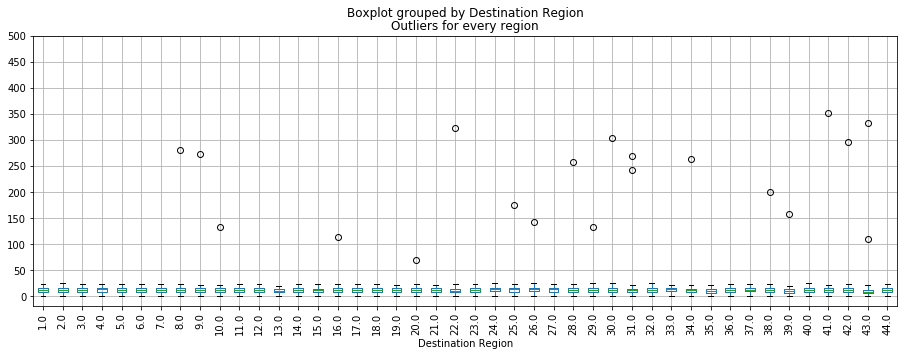

In [315]:
df6_B = df6.boxplot(column = 'distance_outlier_dest', by='Destination Region', rot=90, figsize=(15,5))
plt.title('Outliers for every region')
plt.yticks([0,50,100,150,200,250,300,350,400,450,500])
plt.show()

From the above boxplot, it can be seen that the outliers are the ones with __distance_outlier_dest > 50__. Thus, we combine outliers with the null values by making them NaN.

In [316]:
df6['Destination Region'] = df6.apply(lambda row:np.nan if row['distance_outlier_dest'] > 50 else row['Destination Region'],axis = 1)

After combining outliers with the null values, check for total null values in __Destination Region__.

In [317]:
df6[df6['Destination Region'].isnull()].shape

(30, 22)

In [318]:
df6['Destination Region'].fillna(value = 999.0, inplace=True) # fill null values with significantly high value


In [319]:
print(df6[df6['Destination Region'] == 999.0].shape)
df6[df6['Destination Region'] == 999.0].head()

(30, 22)


,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,...,Departure Time,Travel Time,Delivery Time,Delivery Fare,mean_lat,mean_long,distance_outlier,mean_lat_dest,mean_long_dest,distance_outlier_dest
304,ID1386933806,1.0,0.0,36.599,6.0,999.0,-36.541226,147.504160,-38.679881,144.375493,...,13:21:54,354.24,19:16:08,109.42,-36.634677,147.436952,12.012542,-37.793910,143.357617,132.841042
311,ID1426014187,1.0,0.0,36.611,2.0,999.0,-37.046294,143.723303,-37.311757,146.486527,...,08:51:17,242.31,12:53:35,91.34,-37.093428,143.907026,17.141078,-38.868101,142.993283,351.642856
2056,ID5687710573,2.0,1.0,26.269,43.0,999.0,-36.545797,144.960061,-38.500395,148.238380,...,10:33:26,331.31,16:04:44,159.68,-36.577787,145.044344,8.334878,NaN,NaN,NaN
2104,ID1371433291,1.0,0.0,13.700,33.0,999.0,-37.275153,143.409340,-38.057342,142.787338,...,15:04:38,105.21,16:49:50,87.60,-37.376428,143.210995,20.865216,NaN,NaN,NaN
4145,ID5175830633,1.0,1.0,28.886,10.0,999.0,-37.650842,143.227738,-38.107832,145.091358,...,09:02:18,170.52,11:52:49,115.89,-37.798372,143.368675,20.583716,NaN,NaN,NaN


#### K-Nearest Neighbor Fit and Predict part for Destination Region

In [320]:
# fit the Origin Latitude and Origin Longitude against Origin Region
neighbors.fit(df6.iloc[:,8:10], df6['Destination Region'])

# apply prediction on Destination Region = 999.0
df6['Destination Region'] = df6.apply(lambda row: 
                                     neighbors.predict([row[['Destination Latitude', 'Destination Longitude']]])
                                     if row['Destination Region'] == 999.0
                                     else
                                     row['Destination Region']
                                     ,axis = 1)

df6['Destination Region'] = df6['Destination Region'].astype(float)

##### Plot the Destination Region based on Destination LatLong after applying K-Nearest Nighbors

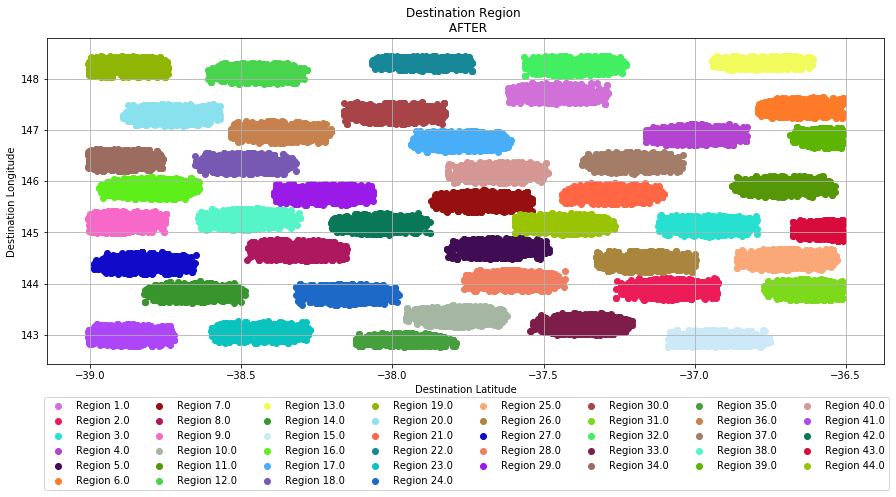

In [321]:
plt.figure(figsize=(15,6))

dest_region = df6['Destination Region'].unique().tolist()
dest_region.sort()

for i in dest_region:
    plt.scatter(df6[df6['Destination Region'] == i]['Destination Latitude'], df6[df6['Destination Region'] == i]['Destination Longitude'],\
                c=np.random.rand(3,), \
               label = 'Region {}'.format(i))

plt.grid()
plt.xlabel('Destination Latitude')
plt.ylabel('Destination Longitude')
plt.title('Destination Region \n AFTER')
plt.legend(loc = 'lower left', ncol=8, bbox_to_anchor=(-0.01, -0.4))
# plt.colorbar(use_gridspec= True)
plt.show()

In [322]:
df6[(df6['Origin Region'] == 999.0) | (df6['Origin Region'].isnull())]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,...,Departure Time,Travel Time,Delivery Time,Delivery Fare,mean_lat,mean_long,distance_outlier,mean_lat_dest,mean_long_dest,distance_outlier_dest


In [323]:
df6[(df6['Destination Region'] == 999.0) | (df6['Destination Region'].isnull())]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,...,Departure Time,Travel Time,Delivery Time,Delivery Fare,mean_lat,mean_long,distance_outlier,mean_lat_dest,mean_long_dest,distance_outlier_dest


### *In conclusion, there is no more null values neither outlier values in both Origin Region and Destination Region*

## Checking for semantic errors in Journey Distance

In [324]:
df7 = df6.copy()

#### In order to fix the Journey Distance, first we have to find the correct distance from the Origin LatLong to the Destination LatLong using the pre-defined function *get_distance*

In [325]:
df7['new_distance'] = df7.apply(lambda row: round(get_distance(row.loc['Origin Latitude'], \
                                                         row.loc['Origin Longitude'], \
                                                         row.loc['Destination Latitude'], \
                                                         row.loc['Destination Longitude']),3), axis = 1)

#### Find the distance difference between original Journey Distance and the new_distance column.

In [326]:
df7['dist_diff'] = df7.apply(lambda row: round(row.loc['new_distance'],3) - round(row.loc['Journey Distance'],3), axis = 1)

In [327]:
print(df7[df7['dist_diff'] != 0].shape)
df7[df7['dist_diff'] != 0].head()

(15, 24)


,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,...,Delivery Time,Delivery Fare,mean_lat,mean_long,distance_outlier,mean_lat_dest,mean_long_dest,distance_outlier_dest,new_distance,dist_diff
8414,ID1821558093,2.0,0.0,39.415,36.0,43.0,-38.270403,146.979550,-36.631292,145.079500,...,1:05:08,145.72,-38.362420,146.958491,10.406938,-36.584232,145.057284,5.602178,247.951,-8.9
10620,ID1128976368,1.0,0.0,15.717,18.0,9.0,-38.363476,146.228288,-38.909548,144.991473,...,0:58:16,107.60,-38.477746,146.343883,16.230849,-38.888869,145.203486,18.510992,123.533,-3.3
12518,ID1379828210,2.0,0.0,37.626,26.0,39.0,-37.109865,144.528725,-36.513706,146.786157,...,0:28:11,138.29,-37.161734,144.437145,9.969358,-36.581743,146.853299,9.665011,211.841,-8.1
14568,ID1921134523,2.0,0.0,36.187,31.0,11.0,-36.555216,143.964688,-36.602287,145.906397,...,19:19:59,129.72,-36.635176,143.870705,12.238443,-36.705291,145.910843,11.473076,173.649,-9.6
14578,ID1361225328,1.0,0.0,7.411,12.0,33.0,-38.556988,148.174396,-37.335230,143.058303,...,13:24:30,124.43,-38.449557,148.113163,13.094666,-37.370497,143.211667,14.127182,469.172,0.9


#### If the dist_diff is not 0, we replace the Journey Distance with the correct value from new_distance, otherwise keep using the Journey Distance value.

In [328]:
df7['Journey Distance'] = df7.apply(lambda row: row['new_distance'] if row['dist_diff'] != 0 else row['Journey Distance'], axis = 1)

#### Check again if the new value for Journey Distance has been updated indicated by there's no more *non-zero* values when substracting Journey Distance with new_distance

In [329]:
df7[round(df7['Journey Distance'],3) - round(df7['new_distance'],3) != 0]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,...,Delivery Time,Delivery Fare,mean_lat,mean_long,distance_outlier,mean_lat_dest,mean_long_dest,distance_outlier_dest,new_distance,dist_diff


## Checking and Fixing the syntatic error in Departure Date column.

In [330]:
df8 = df7.copy()

In [331]:
df8.head()

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,...,Delivery Time,Delivery Fare,mean_lat,mean_long,distance_outlier,mean_lat_dest,mean_long_dest,distance_outlier_dest,new_distance,dist_diff
0,ID1444984021,2.0,0.0,13.148,19.0,18.0,-38.855486,148.089969,-38.603784,146.352910,...,6:04:10,133.58,-38.878347,148.230264,12.423096,-38.486793,146.348440,13.028939,153.422,0.0
1,ID5501951172,1.0,1.0,31.699,27.0,15.0,-38.675330,144.507731,-36.891363,142.780603,...,11:15:50,123.61,-38.821446,144.396308,18.924299,-36.921777,142.920817,12.931671,250.038,0.0
2,ID1171009351,2.0,0.0,29.154,30.0,33.0,-38.097408,147.275392,-37.497069,143.339089,...,15:10:26,127.72,-37.990762,147.339204,13.123507,-37.370497,143.211667,18.038156,352.602,0.0
3,ID1413097998,2.0,0.0,10.217,36.0,37.0,-38.439090,147.045213,-37.112349,146.463208,...,6:09:56,139.24,-38.362420,146.958491,11.405030,-37.206844,146.357662,14.082698,156.314,0.0
4,ID1739660836,1.0,0.0,28.159,22.0,34.0,-37.932769,148.176283,-38.856155,146.486607,...,23:45:08,93.84,-37.895439,148.330791,14.191168,-38.891082,146.419498,6.995864,179.708,0.0


#### Splitting the Departure Date Column into a new dataframe with columns year, month, and day

In [332]:
colDate = df8['Departure Date'].apply(lambda row: pd.Series({'year': row.split('-')[0].strip(), 'month': row.split('-')[1].strip(), 'day': row.split('-')[2].strip()}))

#### convert to int

In [333]:
colDate['year'] = colDate['year'].astype(int)
colDate['month'] = colDate['month'].astype(int)
colDate['day'] = colDate['day'].astype(int)

colDate.dtypes

year     int32
month    int32
day      int32
dtype: object

In [334]:
colDate.describe()

,year,month,day
count,35945.0,35945.000000,35945.000000
mean,2018.0,4.061705,14.515899
std,0.0,2.234233,8.192146
min,2018.0,1.000000,1.000000
25%,2018.0,2.000000,7.000000
50%,2018.0,4.000000,14.000000
75%,2018.0,6.000000,22.000000
max,2018.0,30.000000,31.000000


#### from above statistic summary, there is a month with value of 30, the max value for month should be 12. Let's check for month values that are more than 12.

In [335]:
print('There are {} rows that have month > 12'.format(colDate[colDate['month'] > 12].shape[0]))

# list of unique days that have month > 12
print("array of days for month > 12:", colDate[colDate['month'] > 12]['day'].unique())

There are 123 rows that have month > 12
array of days for month > 12: [7 5 4 6 2 1 3]


#### Switch days with months more than 12

In [336]:
colDate['new_month'] = colDate.apply(lambda row: row['day'] if row['month'] > 12 else row['month'], axis = 1)
colDate['new_day'] = colDate.apply(lambda row: row['month'] if row['month'] > 12 else row['day'], axis = 1)

In [337]:
colDate[['year', 'new_month', 'new_day']].describe()

,year,new_month,new_day
count,35945.0,35945.000000,35945.000000
mean,2018.0,4.005870,14.571735
std,0.0,2.002487,8.180428
min,2018.0,1.000000,1.000000
25%,2018.0,2.000000,7.000000
50%,2018.0,4.000000,15.000000
75%,2018.0,6.000000,22.000000
max,2018.0,7.000000,31.000000


#### months have been fixed with min month = 1 and max month = 7. Next step is to check whether the MAX days are correct for each month.

In [338]:
colDate.groupby('new_month')['new_day'].max()

new_month
1    28
2    30
3    28
4    31
5    28
6    31
7    28
Name: new_day, dtype: int64

#### Found 3 months that have the wrong max day value, they are month 2, 4, and 6. Month 2 should have max value of 28 because 2018 is not a leap year. For both month 4 and 6 should have max value of 30.

In [339]:
print(colDate[(colDate['new_month'].isin([2])) & (colDate['new_day'] > 28)].shape)
colDate[(colDate['new_month'].isin([2])) & (colDate['new_day'] > 28)].head()

(31, 5)


,year,month,day,new_month,new_day
1272,2018,2,30,2,30
1378,2018,2,30,2,30
3201,2018,2,30,2,30
3511,2018,2,30,2,30
5421,2018,2,30,2,30


#### For days that are violating the max day of the month, they will be converted into the max day of that month.

In [340]:
colDate['new_day'] = colDate.apply(lambda row: 28 if row['new_month'] == 2 and row['new_day'] > 28
                                   else (30 if row['new_month'] == 4 and row['new_day'] > 30 
                                        else (30 if row['new_month'] == 6 and row['new_day'] > 30
                                             else row['new_day']))
                                   , axis = 1)

#### Check again whether the max day for each month has been fixed.

In [341]:
colDate.groupby('new_month')['new_day'].max()

new_month
1    28
2    28
3    28
4    30
5    28
6    30
7    28
Name: new_day, dtype: int64

#### Combine year, new_month, new_day into new_dep_date

In [342]:
colDate['new_dep_date'] = colDate.apply(lambda row: str(row['year']) + '-' + str(row['new_month']) + '-' + str(row['new_day']), axis = 1)

#### Try to convert new_dep_date into a date format to check whether the dates are in the correct format.

In [343]:
colDate['new_dep_date'] = pd.to_datetime(colDate['new_dep_date'], format = '%Y-%m-%d')

In [344]:
print(colDate.head())
colDate.dtypes

   year  month  day  new_month  new_day new_dep_date
0  2018      2   27          2       27   2018-02-27
1  2018      1   28          1       28   2018-01-28
2  2018      6   21          6       21   2018-06-21
3  2018      1   19          1       19   2018-01-19
4  2018      5    1          5        1   2018-05-01


year                     int32
month                    int32
day                      int32
new_month                int64
new_day                  int64
new_dep_date    datetime64[ns]
dtype: object

In [345]:
df8 = pd.concat([df8, colDate['new_dep_date']], axis = 1)

In [346]:
df8['new_dep_date'] = df8['new_dep_date'].astype(str)
df8[['Departure Date','new_dep_date']].dtypes

Departure Date    object
new_dep_date      object
dtype: object

In [347]:
print(df8[df8['Departure Date'] != df8['new_dep_date']].shape)
df8[df8['Departure Date'] != df8['new_dep_date']][['Departure Date', 'new_dep_date']].head()

(223, 25)


,Departure Date,new_dep_date
878,2018-24-07,2018-07-24
891,2018-23-05,2018-05-23
906,2018-28-04,2018-04-28
1157,2018-19-06,2018-06-19
1272,2018-02-30,2018-02-28


#### There are 223 rows that have the wrong format of Departure Date, thus those rows will be replaced with new_dep_date

In [348]:
df8['Departure Date'] = df8.apply(lambda row: row['new_dep_date'] if row['Departure Date'] != row['new_dep_date'] 
                                 else row['Departure Date'], axis = 1)


#### Testing if the new Departure Date column is correct by trying to convert it to date format

In [349]:
df8['test_date'] = df8['Departure Date']

In [350]:
df8['test_date'] = pd.to_datetime(df8['test_date'], format = '%Y-%m-%d')
df8['test_date'].dtypes

dtype('<M8[ns]')

#### In conclusion the Departure Date column can be converted and proved that the format has been corrected

In [351]:
df8.drop(['test_date'], axis = 1, inplace=True)

## Checking Departure Time

In [352]:
df9 = df8.copy()
df9 = df9.iloc[:,0:16]

In [353]:
colDeptTime = pd.DataFrame()

colDeptTime['dept_time'] = df9['Departure Time']

colDeptTime['check_delim'] = colDeptTime.apply(lambda row: 1 if ':' in row['dept_time'] else 0, axis = 1)

colDeptTime[colDeptTime['check_delim'] == 0]

,dept_time,check_delim


#### Departure time has a fixed delimiter of colon $":"$

In [354]:
colDeptTime['new_dept_time'] = pd.to_datetime(colDeptTime['dept_time'], format = '%H:%M:%S').dt.time

In [355]:
print(colDeptTime[colDeptTime['dept_time'] != colDeptTime['new_dept_time'].astype(str)].shape)
colDeptTime[colDeptTime['dept_time'] != colDeptTime['new_dept_time'].astype(str)].head()

(16, 3)


,dept_time,check_delim,new_dept_time
812,9:51:14,1,09:51:14
1837,1:58:04,1,01:58:04
2893,5:54:04,1,05:54:04
4904,8:34:20,1,08:34:20
8984,1:08:33,1,01:08:33


In [356]:
df9 = pd.concat([df9, colDeptTime['new_dept_time']], axis = 1)

In [357]:
# Before fixing Departure Time
print(df9[df9['Departure Time'] != df9['new_dept_time'].astype(str)][['Departure Time', 'new_dept_time']].shape)
df9[df9['Departure Time'] != df9['new_dept_time'].astype(str)][['Departure Time', 'new_dept_time']].head()

(16, 2)


,Departure Time,new_dept_time
812,9:51:14,09:51:14
1837,1:58:04,01:58:04
2893,5:54:04,05:54:04
4904,8:34:20,08:34:20
8984,1:08:33,01:08:33


In [358]:
df9['Departure Time'] = df9.apply(lambda row: str(row['new_dept_time']) if row['Departure Time'] != str(row['new_dept_time']) else row['Departure Time'], axis = 1)

In [359]:
# After fixing the Departure Time
df9[df9['Departure Time'] != df9['new_dept_time'].astype(str)]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare,new_dept_time


In [360]:
df9.drop(['new_dept_time'], axis = 1, inplace = True)

In [361]:
df9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35945 entries, 0 to 35944
Data columns (total 16 columns):
Id                       35945 non-null object
Drone Type               35935 non-null float64
Post Type                35925 non-null float64
Package Weight           35945 non-null float64
Origin Region            35945 non-null float64
Destination Region       35945 non-null float64
Origin Latitude          35945 non-null float64
Origin Longitude         35945 non-null float64
Destination Latitude     35945 non-null float64
Destination Longitude    35945 non-null float64
Journey Distance         35945 non-null float64
Departure Date           35945 non-null object
Departure Time           35945 non-null object
Travel Time              35905 non-null float64
Delivery Time            35945 non-null object
Delivery Fare            35915 non-null float64
dtypes: float64(12), object(4)
memory usage: 4.1+ MB


## Fixing Delivery Time

In [362]:
df10 = df9.copy()

In [363]:
df10.head()

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare
0,ID1444984021,2.0,0.0,13.148,19.0,18.0,-38.855486,148.089969,-38.603784,146.352910,153.422,2018-02-27,03:39:42,144.48,6:04:10,133.58
1,ID5501951172,1.0,1.0,31.699,27.0,15.0,-38.675330,144.507731,-36.891363,142.780603,250.038,2018-01-28,07:10:30,245.35,11:15:50,123.61
2,ID1171009351,2.0,0.0,29.154,30.0,33.0,-38.097408,147.275392,-37.497069,143.339089,352.602,2018-06-21,09:47:35,322.85,15:10:26,127.72
3,ID1413097998,2.0,0.0,10.217,36.0,37.0,-38.439090,147.045213,-37.112349,146.463208,156.314,2018-01-19,03:42:52,147.07,6:09:56,139.24
4,ID1739660836,1.0,0.0,28.159,22.0,34.0,-37.932769,148.176283,-38.856155,146.486607,179.708,2018-05-01,20:46:46,178.37,23:45:08,93.84


#### At first and fourth column, the Delivery Time do not have the same format as the Departure Time. Thus, we have to fix the syntatic error in Delivery Time.

In [364]:

df10['new_del_time'] = pd.to_datetime(df10['Delivery Time'], format = '%H:%M:%S').dt.time

In [365]:

df10[(df10['Delivery Time'] != df10['new_del_time'].astype('str'))].shape

(14930, 17)

#### There are 14930 rows of Delivery Time that do not have the same format as Departure Time. Thus we only fix those rows to the correct format of Time.

In [366]:
df10['Delivery Time'] = df10.apply(lambda row: str(row['new_del_time'])
                                   if row['Delivery Time'] != str(row['new_del_time'])
                                   else row['Delivery Time']
                                  ,axis = 1)

#### Check again.

In [367]:
print(df10[(df10['Delivery Time'] != df10['new_del_time'].astype('str'))].shape)
df10.head()

(0, 17)


,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare,new_del_time
0,ID1444984021,2.0,0.0,13.148,19.0,18.0,-38.855486,148.089969,-38.603784,146.352910,153.422,2018-02-27,03:39:42,144.48,06:04:10,133.58,06:04:10
1,ID5501951172,1.0,1.0,31.699,27.0,15.0,-38.675330,144.507731,-36.891363,142.780603,250.038,2018-01-28,07:10:30,245.35,11:15:50,123.61,11:15:50
2,ID1171009351,2.0,0.0,29.154,30.0,33.0,-38.097408,147.275392,-37.497069,143.339089,352.602,2018-06-21,09:47:35,322.85,15:10:26,127.72,15:10:26
3,ID1413097998,2.0,0.0,10.217,36.0,37.0,-38.439090,147.045213,-37.112349,146.463208,156.314,2018-01-19,03:42:52,147.07,06:09:56,139.24,06:09:56
4,ID1739660836,1.0,0.0,28.159,22.0,34.0,-37.932769,148.176283,-38.856155,146.486607,179.708,2018-05-01,20:46:46,178.37,23:45:08,93.84,23:45:08


#### The Delivery Time column has been fixed to the correct format of HH:MM:SS

In [368]:
df10.drop(['new_del_time'], axis = 1, inplace = True)

## Checking for semantic errors in Travel Time. 
#### The Travel Time should be equal to Delivery Time - Departure Time. But because some of the Delivery Time are smaller than Departure Time, thus we add 1 day to the Delivery Time in a temporary column.
#### After that we can compare the time delta between result of Delivery TIme - Departure Time with the Travel Time.

In [369]:
df11 = df10.copy()

In [370]:
df11['t_dep_time'] = pd.to_datetime(df11['Departure Time'])
df11['t_del_time'] = pd.to_datetime(df11['Delivery Time'])

In [371]:
df11['t_del_time'] = df11.apply(lambda row: row['t_del_time'] + pd.DateOffset(days=1)
                                if row['t_del_time'] < row['t_dep_time']
                                else row['t_del_time']
                               ,axis = 1)

df11[df11['t_del_time'] < df11['t_dep_time']].shape

(0, 18)

#### No more t_del_time that are smaller than t_dep_time
#### Next we check the time difference between original Travel Time with the t_del_time - t_dep_time

In [372]:
df11['t_trav_time'] = (df11['t_del_time']-df11['t_dep_time']).astype('timedelta64[s]') / 60
df11['diff_time'] = abs(round(df11['Travel Time'],2) - round(df11['t_trav_time'],2))

In [373]:
print(df11[(~df11['Travel Time'].isnull()) & (df11['diff_time'] > 500)].shape)
df11[(~df11['Travel Time'].isnull()) & (df11['diff_time'] > 500)].head()

(40, 20)


,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare,t_dep_time,t_del_time,t_trav_time,diff_time
773,ID1807078101,1.0,0.0,29.595,27.0,26.0,-38.753078,144.442451,-37.271800,144.342018,165.127,2018-05-01,12:48:47,164.49,10:04:18,83.45,2018-10-04 12:48:47,2018-10-05 10:04:18,1275.516667,1111.03
812,ID1564499654,1.0,0.0,15.950,33.0,36.0,-37.221250,143.228635,-38.449829,146.853997,346.794,2018-03-27,09:51:14,337.50,04:13:44,123.64,2018-10-04 09:51:14,2018-10-05 04:13:44,1102.500000,765.00
1153,ID1386135552,1.0,0.0,16.825,5.0,26.0,-37.520860,144.722959,-37.211259,144.507406,39.388,2018-03-11,22:34:12,44.73,21:49:29,92.98,2018-10-04 22:34:12,2018-10-05 21:49:29,1395.283333,1350.55
1837,ID1534822287,3.0,0.0,14.028,5.0,10.0,-37.618569,144.732860,-37.926281,143.332972,127.850,2018-03-22,01:58:04,119.65,23:58:25,166.84,2018-10-04 01:58:04,2018-10-04 23:58:25,1320.350000,1200.70
2843,ID1876872937,1.0,0.0,10.077,41.0,31.0,-38.830413,142.832850,-36.606413,144.035345,269.255,2018-02-24,23:43:01,263.66,19:19:22,96.61,2018-10-04 23:43:01,2018-10-05 19:19:22,1176.350000,912.69


#### There are 24 rows with time difference more than 500, these rows look like the Departure Time and Delivery Time are flipped. For the next step, we try to flip Departure Time with Delivery Time and then check whether these rows have been eliminated.

In [374]:
df11[(~df11['Travel Time'].isnull()) & (df11['diff_time'] > 500)].iloc[0,17].strftime(format='%H:%M:%S')

'10:04:18'

#### Flipping Departure Time with Delivery Time and vice versa if difference is > 500.

In [375]:
df11['Departure Time'] = df11.apply(lambda row: row['t_del_time'].strftime(format='%H:%M:%S')
                  if row['diff_time'] > 500
                  else row['Departure Time']
                 ,axis = 1)

df11['Delivery Time'] = df11.apply(lambda row: row['t_dep_time'].strftime(format='%H:%M:%S')
                  if row['diff_time'] > 500
                  else row['Delivery Time']
                 ,axis = 1)

#### Re-test again to see if the huge time differences are gone.

In [376]:
df11['t_dep_time'] = pd.to_datetime(df11['Departure Time'])
df11['t_del_time'] = pd.to_datetime(df11['Delivery Time'])

In [377]:
df11['t_del_time'] = df11.apply(lambda row: row['t_del_time'] + pd.DateOffset(days=1)
                                if row['t_del_time'] < row['t_dep_time']
                                else row['t_del_time']
                               ,axis = 1)

df11[df11['t_del_time'] < df11['t_dep_time']].shape

(0, 20)

In [378]:
df11['t_trav_time'] = (df11['t_del_time']-df11['t_dep_time']).astype('timedelta64[s]') / 60
df11['diff_time'] = abs(round(df11['Travel Time'],2) - round(df11['t_trav_time'],2))

In [379]:
print(df11[(~df11['Travel Time'].isnull()) & (df11['diff_time'] > 500)].shape)
df11[(~df11['Travel Time'].isnull()) & (df11['diff_time'] > 500)].head()

(0, 20)


,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare,t_dep_time,t_del_time,t_trav_time,diff_time


#### *In conclusion, the rows with travel time difference more than 500 have been eliminated.*

# ----------------------------------------------------------------------------------------------------

#### IN CONCLUSION, FOR TRAVEL TIME THAT ARE NOT NULL, THERE ARE *NO MORE* SEMANTIC ERRORS IN TRAVEL TIME COLUMN.
#### NEXT WE WILL BE FIXING THE NULL TRAVEL TIME BY CALCULATING THE SPEED FOR EVERY DRONE TYPE.

In [380]:
df11.drop(['t_dep_time', 't_del_time','t_trav_time', 'diff_time'], axis = 1, inplace = True)

In [381]:
df11.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35945 entries, 0 to 35944
Data columns (total 16 columns):
Id                       35945 non-null object
Drone Type               35935 non-null float64
Post Type                35925 non-null float64
Package Weight           35945 non-null float64
Origin Region            35945 non-null float64
Destination Region       35945 non-null float64
Origin Latitude          35945 non-null float64
Origin Longitude         35945 non-null float64
Destination Latitude     35945 non-null float64
Destination Longitude    35945 non-null float64
Journey Distance         35945 non-null float64
Departure Date           35945 non-null object
Departure Time           35945 non-null object
Travel Time              35905 non-null float64
Delivery Time            35945 non-null object
Delivery Fare            35915 non-null float64
dtypes: float64(12), object(4)
memory usage: 4.1+ MB


## FIXING TRAVEL TIME WITH DRONE TYPE 

#### Exclude the travel time that are null values. As well as removing the Drone Types that are null.

In [382]:
temp = df11[~(df11['Travel Time'].isnull()) & ~(df11['Drone Type'].isnull())]

In [383]:
temp = temp[['Id','Drone Type', 'Journey Distance', 'Travel Time']]
temp['time_h'] = temp['Travel Time'] / 60

In [384]:
temp.head()

,Id,Drone Type,Journey Distance,Travel Time,time_h
0,ID1444984021,2.0,153.422,144.48,2.408000
1,ID5501951172,1.0,250.038,245.35,4.089167
2,ID1171009351,2.0,352.602,322.85,5.380833
3,ID1413097998,2.0,156.314,147.07,2.451167
4,ID1739660836,1.0,179.708,178.37,2.972833


In [385]:
temp_1 = temp[temp['Drone Type'] == 1]
temp_2 = temp[temp['Drone Type'] == 2]
temp_3 = temp[temp['Drone Type'] == 3]

temp_1.head()

,Id,Drone Type,Journey Distance,Travel Time,time_h
1,ID5501951172,1.0,250.038,245.35,4.089167
4,ID1739660836,1.0,179.708,178.37,2.972833
6,ID1146736047,1.0,438.656,424.99,7.083167
7,ID5482036389,1.0,171.760,170.80,2.846667
9,ID1166088782,1.0,210.437,207.64,3.460667


#### Create Function that will iterate until there's no more outlier in a dataframe. This function will be used in order to find the z and beta.

In [386]:
def clean_tt(df):
    
    df_cp = df.copy()
    mid = df_cp.shape[0] // 2
    
    temp_1_1 = df_cp.iloc[:mid,:]
    temp_1_2 = df_cp.iloc[mid:df_cp.shape[0],:]
    
    z = (temp_1_1['Journey Distance'].mean() - temp_1_2['Journey Distance'].mean()) / (temp_1_1['Travel Time'].mean() - temp_1_2['Travel Time'].mean())
    
    df_cp['z'] = z
    df_cp['ntt'] = df_cp['Journey Distance'] / df_cp['z']
    
    df_cp['time_diff'] = abs(df_cp['Travel Time'] - df_cp['ntt'])
    
    Q1 = df_cp['time_diff'].quantile(0.25)
    Q3 = df_cp['time_diff'].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - (1.5*IQR)
    upper = Q3 + (1.5*IQR)
    
    outliers = df_cp[(df_cp['time_diff'] > upper) | (df_cp['time_diff'] < lower)].shape[0]
    
    while outliers > 0:
        df_cp = df_cp[(df_cp['time_diff'] < upper) & (df_cp['time_diff'] > lower)]
        
        mid = df_cp.shape[0] // 2
    
        temp_1_1 = df_cp.iloc[:mid,:]
        temp_1_2 = df_cp.iloc[mid:df_cp.shape[0],:]

        z = (temp_1_1['Journey Distance'].mean() - temp_1_2['Journey Distance'].mean()) / (temp_1_1['Travel Time'].mean() - temp_1_2['Travel Time'].mean())

        df_cp['z'] = z
        df_cp['ntt'] = df_cp['Journey Distance'] / df_cp['z']

        df_cp['time_diff'] = abs(df_cp['Travel Time'] - df_cp['ntt'])

        Q1 = df_cp['time_diff'].quantile(0.25)
        Q3 = df_cp['time_diff'].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - (1.5*IQR)
        upper = Q3 + (1.5*IQR)

        outliers = df_cp[(df_cp['time_diff'] > upper) | (df_cp['time_diff'] < lower)].shape[0]
    
    return df_cp

In [387]:
temp_1_clean = clean_tt(temp_1)

In [388]:
temp_1_clean.shape

(17739, 8)

In [389]:
print(temp_1_clean[temp_1_clean['time_diff'] == temp_1_clean['time_diff'].min()])
temp_1_clean.shape

                 Id  Drone Type  Journey Distance  Travel Time  time_h  \
11818  ID5451309851         1.0           472.922       457.62   7.627   

             z         ntt  time_diff  
11818  1.04997  450.414742   7.205258  


(17739, 8)

#### GET $\beta$ for Drone Type 1

In [390]:
m_time_h = temp_1_clean['Travel Time'].mean()
m_dist = temp_1_clean['Journey Distance'].mean()
m_z = temp_1_clean['z'].mean()
print(m_time_h)
print(m_dist)
print(m_z)

beta_1 = (m_dist - ((m_time_h - 10) * m_z)) * 12
print(beta_1)

205.96873442696884
208.68382372174307
1.0499700734516877
35.07020689469175


In [391]:
temp_1_fin = temp_1
temp_1_fin['z1'] = m_z
temp_1_fin['beta_1'] = beta_1

temp_1_fin.shape

(17826, 7)

In [392]:
temp_1_fin.head()

,Id,Drone Type,Journey Distance,Travel Time,time_h,z1,beta_1
1,ID5501951172,1.0,250.038,245.35,4.089167,1.04997,35.070207
4,ID1739660836,1.0,179.708,178.37,2.972833,1.04997,35.070207
6,ID1146736047,1.0,438.656,424.99,7.083167,1.04997,35.070207
7,ID5482036389,1.0,171.760,170.80,2.846667,1.04997,35.070207
9,ID1166088782,1.0,210.437,207.64,3.460667,1.04997,35.070207


In [393]:
temp_1_fin['ntt'] = temp_1_fin.apply(lambda row: 10 + ((row['Journey Distance'] - (row['beta_1']/12))/row['z1'])
                                       , axis = 1)

In [394]:
temp_1_fin['time_diff'] = abs(temp_1_fin['Travel Time'] - temp_1_fin['ntt'])

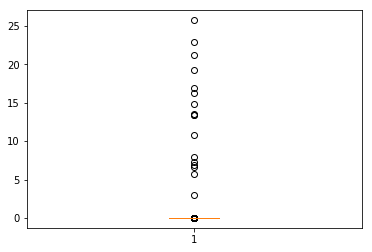

In [395]:
plt.boxplot(temp_1_fin['time_diff'])
plt.show()

#### Checking number of rows with time difference more than 1

In [396]:
t_Q1 = temp_1_fin['time_diff'].quantile(0.25)
t_Q3 = temp_1_fin['time_diff'].quantile(0.75)
t_IQR = t_Q3 - t_Q1

t_lower = t_Q1 - (1.5 * t_IQR)
t_upper = t_Q3 + (1.5 * t_IQR)

print(t_upper, t_lower)

temp_1_fin[temp_1_fin['time_diff'] > 0.02].shape


0.010155949954551602 -0.0038737915537438994


(17, 9)

#### The above result shows that there are 17 rows that have big difference between the old Travel Time with the new travel time ("ntt" column). We keep these rows to further analyse by comparing with the Drone Type 2 and 3.

#### The next process is to apply the previous process done previously for the Drone Type 2 and 3.

### For Drone Type 2

In [397]:
temp_2_clean = clean_tt(temp_2)

In [398]:
temp_2_clean.shape

(10783, 8)

#### Get $\beta$ for Drone Type 2

In [399]:
m_time_h = temp_2_clean['Travel Time'].mean()
m_dist = temp_2_clean['Journey Distance'].mean()
m_z = temp_2_clean['z'].mean()
print(m_time_h)
print(m_dist)
print(m_z)

beta_2 = (m_dist - ((m_time_h - 10) * m_z)) * 12
print(beta_2)

192.97628025595844
207.57349902624503
1.1166070428925607
39.13074972190577


In [400]:
temp_2_fin = temp_2.copy()
temp_2_fin['z2'] = m_z
temp_2_fin['beta_2'] = beta_2

temp_2_fin.shape

(10863, 7)

In [401]:
temp_2_fin.head()

,Id,Drone Type,Journey Distance,Travel Time,time_h,z2,beta_2
0,ID1444984021,2.0,153.422,144.48,2.408000,1.116607,39.13075
2,ID1171009351,2.0,352.602,322.85,5.380833,1.116607,39.13075
3,ID1413097998,2.0,156.314,147.07,2.451167,1.116607,39.13075
5,ID1271363835,2.0,281.572,259.24,4.320667,1.116607,39.13075
15,ID1636024912,2.0,121.325,115.74,1.929000,1.116607,39.13075


In [402]:
temp_2_fin['ntt'] = temp_2_fin.apply(lambda row: 10 + ((row['Journey Distance'] - (row['beta_2']/12))/row['z2'])
                                       , axis = 1)

In [403]:
temp_2_fin['time_diff'] = abs(temp_2_fin['Travel Time'] - temp_2_fin['ntt'])

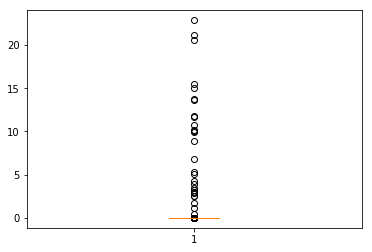

In [404]:
plt.boxplot(temp_2_fin['time_diff'])
plt.show()

#### Checking number of rows with time difference more than 1

In [405]:
t_Q1 = temp_2_fin['time_diff'].quantile(0.25)
t_Q3 = temp_2_fin['time_diff'].quantile(0.75)
t_IQR = t_Q3 - t_Q1

t_lower = t_Q1 - (1.5 * t_IQR)
t_upper = t_Q3 + (1.5 * t_IQR)

print(t_upper, t_lower)

temp_2_fin[temp_2_fin['time_diff'] > 1].shape


0.01452643759132144 -0.00562220861331042


(28, 9)

#### FOR Drone Type 3

In [406]:
temp_3_clean = clean_tt(temp_3)

In [407]:
temp_3_clean.shape

(7186, 8)

#### Get $\beta$ for Drone Type 3

In [408]:
m_time_h = temp_3_clean['Travel Time'].mean()
m_dist = temp_3_clean['Journey Distance'].mean()
m_z = temp_3_clean['z'].mean()
print(m_time_h)
print(m_dist)
print(m_z)

beta_3 = (m_dist - ((m_time_h - 10) * m_z)) * 12
print(beta_3)

189.31906623991094
206.81161355413303
1.1332983148160953
43.0754156405543


In [409]:
temp_3_fin = temp_3.copy()
temp_3_fin['z3'] = m_z
temp_3_fin['beta_3'] = beta_3

temp_3_fin.shape

(7206, 7)

In [410]:
temp_3_fin.head()

,Id,Drone Type,Journey Distance,Travel Time,time_h,z3,beta_3
8,ID5917900433,3.0,253.959,230.92,3.848667,1.133298,43.075416
12,ID5990856018,3.0,191.313,175.64,2.927333,1.133298,43.075416
33,ID1533023785,3.0,89.504,85.81,1.430167,1.133298,43.075416
35,ID5969909479,3.0,484.002,433.90,7.231667,1.133298,43.075416
37,ID1894806789,3.0,400.822,360.51,6.008500,1.133298,43.075416


In [411]:
temp_3_fin['ntt'] = temp_3_fin.apply(lambda row: 10 + ((row['Journey Distance'] - (row['beta_3']/12))/row['z3'])
                                       , axis = 1)

In [412]:
temp_3_fin['time_diff'] = abs(temp_3_fin['Travel Time'] - temp_3_fin['ntt'])

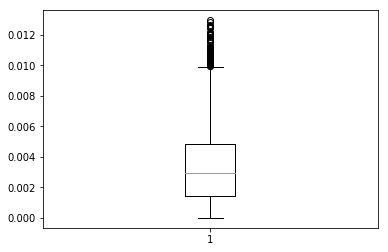

In [413]:
plt.boxplot(temp_3_fin['time_diff'])
plt.show()

#### Checking number of rows with time difference more than 1

In [414]:
t_Q1 = temp_3_fin['time_diff'].quantile(0.25)
t_Q3 = temp_3_fin['time_diff'].quantile(0.75)
t_IQR = t_Q3 - t_Q1

t_lower = t_Q1 - (1.5 * t_IQR)
t_upper = t_Q3 + (1.5 * t_IQR)

print(t_upper, t_lower)

temp_3_fin[temp_3_fin['time_diff'] > 1].shape


0.009953923072148818 -0.0037007522110927837


(0, 9)

In [415]:
temp_1_fin.shape[0] + temp_2_fin.shape[0] + temp_3_fin.shape[0]

35895

In [416]:
df10[(~df10['Drone Type'].isnull()) & (~df10['Travel Time'].isnull())].shape

(35895, 16)

### Next we concatenate the final temp dataframes by rows to make a further analysis.

In [417]:
temp_fin = pd.concat([temp_1_fin, temp_2_fin, temp_3_fin])

c:\users\adam\appdata\local\programs\python\python36-32\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [418]:
pd.concat([temp_fin[temp_fin['Drone Type'] == 1].head(), temp_fin[temp_fin['Drone Type'] == 2].head(), temp_fin[temp_fin['Drone Type'] == 3].head()])

,Drone Type,Id,Journey Distance,Travel Time,beta_1,beta_2,beta_3,ntt,time_diff,time_h,z1,z2,z3
1,1.0,ID5501951172,250.038,245.35,35.070207,NaN,NaN,245.354787,0.004787,4.089167,1.04997,NaN,NaN
4,1.0,ID1739660836,179.708,178.37,35.070207,NaN,NaN,178.371925,0.001925,2.972833,1.04997,NaN,NaN
6,1.0,ID1146736047,438.656,424.99,35.070207,NaN,NaN,424.996097,0.006097,7.083167,1.04997,NaN,NaN
7,1.0,ID5482036389,171.760,170.80,35.070207,NaN,NaN,170.802186,0.002186,2.846667,1.04997,NaN,NaN
9,1.0,ID1166088782,210.437,207.64,35.070207,NaN,NaN,207.638474,0.001526,3.460667,1.04997,NaN,NaN
0,2.0,ID1444984021,153.422,144.48,NaN,39.13075,NaN,144.479811,0.000189,2.408000,NaN,1.116607,NaN
2,2.0,ID1171009351,352.602,322.85,NaN,39.13075,NaN,322.859485,0.009485,5.380833,NaN,1.116607,NaN
3,2.0,ID1413097998,156.314,147.07,NaN,39.13075,NaN,147.069800,0.000200,2.451167,NaN,1.116607,NaN
5,2.0,ID1271363835,281.572,259.24,NaN,39.13075,NaN,259.247133,0.007133,4.320667,NaN,1.116607,NaN
15,2.0,ID1636024912,121.325,115.74,NaN,39.13075,NaN,115.734694,0.005306,1.929000,NaN,1.116607,NaN


In [419]:
# Rearrange columns
temp_fin = temp_fin[['Id', 'Drone Type', 'Journey Distance', 'Travel Time', 'time_h', 'z1', 'beta_1', 'z2', 'beta_2', 'z3', 'beta_3', 'ntt', 'time_diff']]

In [420]:
# Check num of rows between the combined temp dataframes, with the original dataframe that do not have
# Null Drone Type and Null Travel Time
temp_fin.shape[0] == df10[(~df10['Drone Type'].isnull()) & (~df10['Travel Time'].isnull())].shape[0]


True

#### After concatenating, there are null values in each z and beta columns. We fill the null values of z1, z2, z3, beta_1, beta_2, and beta_3 with values from above or belum the null cell.

In [421]:
temp_fin['z1'].fillna(method = 'ffill', inplace = True)
temp_fin['z2'].fillna(method = 'ffill', inplace = True)
temp_fin['z2'].fillna(method = 'bfill', inplace = True)
temp_fin['z3'].fillna(method = 'bfill', inplace = True)

temp_fin['beta_1'].fillna(method = 'ffill', inplace = True)
temp_fin['beta_2'].fillna(method = 'ffill', inplace = True)
temp_fin['beta_2'].fillna(method = 'bfill', inplace = True)
temp_fin['beta_3'].fillna(method = 'bfill', inplace = True)


In [422]:
pd.concat([temp_fin[temp_fin['Drone Type'] == 1].head(), temp_fin[temp_fin['Drone Type'] == 2].head(), temp_fin[temp_fin['Drone Type'] == 3].head()])

,Id,Drone Type,Journey Distance,Travel Time,time_h,z1,beta_1,z2,beta_2,z3,beta_3,ntt,time_diff
1,ID5501951172,1.0,250.038,245.35,4.089167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,245.354787,0.004787
4,ID1739660836,1.0,179.708,178.37,2.972833,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,178.371925,0.001925
6,ID1146736047,1.0,438.656,424.99,7.083167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,424.996097,0.006097
7,ID5482036389,1.0,171.760,170.80,2.846667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,170.802186,0.002186
9,ID1166088782,1.0,210.437,207.64,3.460667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,207.638474,0.001526
0,ID1444984021,2.0,153.422,144.48,2.408000,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,144.479811,0.000189
2,ID1171009351,2.0,352.602,322.85,5.380833,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,322.859485,0.009485
3,ID1413097998,2.0,156.314,147.07,2.451167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,147.069800,0.000200
5,ID1271363835,2.0,281.572,259.24,4.320667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,259.247133,0.007133
15,ID1636024912,2.0,121.325,115.74,1.929000,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,115.734694,0.005306


#### From the above dataframe, the first 5 rows from each of Drone Type have little differences, which are almost 0, thus we fix the ones with time_diff > 1.

In [423]:
fix_temp_fin = temp_fin[temp_fin['time_diff'] > 1]

In [424]:
fix_temp_fin.shape

(45, 13)

#### As can be seen from above, there are 65 rows which have $time difference\gt1$. These rows must be checked whether the errors happen in the travel time, or in the Drone Type.

#### First we calculate the new time difference for each row based on z1 beta1, z2 beta2, and z3 beta3.

In [425]:

fix_temp_fin['new_diff_1'] = fix_temp_fin.apply(lambda row: abs((10 + ((row['Journey Distance'] - 
                                                                    (row['beta_1']/12))/row['z1'])) - 
                                                                    row['Travel Time'])
                                 ,axis = 1)

fix_temp_fin['new_diff_2'] = fix_temp_fin.apply(lambda row: abs((10 + ((row['Journey Distance'] - 
                                                                    (row['beta_2']/12))/row['z2'])) - 
                                                                    row['Travel Time'])
                                 ,axis = 1)

fix_temp_fin['new_diff_3'] = fix_temp_fin.apply(lambda row: abs((10 + ((row['Journey Distance'] - 
                                                                    (row['beta_3']/12))/row['z3'])) - 
                                                                    row['Travel Time'])
                                 ,axis = 1)

In [426]:
fix_temp_fin

,Id,Drone Type,Journey Distance,Travel Time,time_h,z1,beta_1,z2,beta_2,z3,beta_3,ntt,time_diff,new_diff_1,new_diff_2,new_diff_3
2138,ID5719788127,1.0,226.530,206.72,3.445333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,222.965577,16.245577,16.245577,3.233158,0.001820
2677,ID1929966780,1.0,235.234,214.40,3.573333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,231.255337,16.855337,16.855337,3.348201,0.001583
2708,ID5261191188,1.0,235.679,218.15,3.635833,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,231.679159,13.529159,13.529159,0.003270,3.358923
8878,ID1268301855,1.0,137.347,130.09,2.168167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,138.026966,7.936966,7.936966,0.006480,2.065134
10824,ID1993393629,1.0,113.177,108.44,1.807333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,115.007262,6.567262,6.567262,0.002412,1.742263
10837,ID1801733287,1.0,77.092,74.86,1.247667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,80.639616,5.779616,5.779616,1.260937,0.002953
12958,ID1286803462,1.0,125.425,119.41,1.990167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,126.672357,7.262357,7.262357,0.003468,1.904871
14775,ID5416965814,1.0,92.463,88.42,1.473667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,95.279081,6.859081,6.859081,1.466747,0.000113
14946,ID5863618153,1.0,400.912,366.12,6.102000,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,389.048406,22.928406,22.928406,0.004482,5.530595
14976,ID5804065385,1.0,234.052,216.69,3.611500,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,230.129591,13.439591,13.439591,0.000363,3.334556


#### In order to know which travel time belongs to which Drone type, we have to find the *minimum* value between new_diff_1, new_diff_2, and new_diff_3

In [427]:
fix_temp_fin['min'] = fix_temp_fin[['new_diff_1', 'new_diff_2', 'new_diff_3']].min(axis = 1)

# ----------------------------------------------------------------------------------------------------

In [428]:
fix_temp_fin[fix_temp_fin['min'] > 1].shape

(0, 17)

#### From the minimum value, there are no more difference of travel time more than 1. 
#### The next step is to get which Drone Type the minimum value belongs to. 
- If the min value = new_diff_1 then it should be Drone Type 1
- If the min value = new_diff_2 then it should be Drone Type 2
- If the min value = new_diff_3 then it should be Drone Type 3

In [429]:
fix_temp_fin['new_dt'] = fix_temp_fin.apply(lambda row: 1.0 if row['min'] == row['new_diff_1'] else
                                            (2.0 if row['min'] == row['new_diff_2'] else 
                                            (3.0 if row['min'] == row['new_diff_3'] else 0)
                                            )
                                           ,axis = 1)

In [430]:
fix_temp_fin

,Id,Drone Type,Journey Distance,Travel Time,time_h,z1,beta_1,z2,beta_2,z3,beta_3,ntt,time_diff,new_diff_1,new_diff_2,new_diff_3,min,new_dt
2138,ID5719788127,1.0,226.530,206.72,3.445333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,222.965577,16.245577,16.245577,3.233158,0.001820,0.001820,3.0
2677,ID1929966780,1.0,235.234,214.40,3.573333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,231.255337,16.855337,16.855337,3.348201,0.001583,0.001583,3.0
2708,ID5261191188,1.0,235.679,218.15,3.635833,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,231.679159,13.529159,13.529159,0.003270,3.358923,0.003270,2.0
8878,ID1268301855,1.0,137.347,130.09,2.168167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,138.026966,7.936966,7.936966,0.006480,2.065134,0.006480,2.0
10824,ID1993393629,1.0,113.177,108.44,1.807333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,115.007262,6.567262,6.567262,0.002412,1.742263,0.002412,2.0
10837,ID1801733287,1.0,77.092,74.86,1.247667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,80.639616,5.779616,5.779616,1.260937,0.002953,0.002953,3.0
12958,ID1286803462,1.0,125.425,119.41,1.990167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,126.672357,7.262357,7.262357,0.003468,1.904871,0.003468,2.0
14775,ID5416965814,1.0,92.463,88.42,1.473667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,95.279081,6.859081,6.859081,1.466747,0.000113,0.000113,3.0
14946,ID5863618153,1.0,400.912,366.12,6.102000,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,389.048406,22.928406,22.928406,0.004482,5.530595,0.004482,2.0
14976,ID5804065385,1.0,234.052,216.69,3.611500,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,230.129591,13.439591,13.439591,0.000363,3.334556,0.000363,2.0


#### Apply the correct Drone Type to the big dataframe of temp_fin.

In [431]:
temp_fin.loc[temp_fin['Id'].isin(fix_temp_fin['Id']), ['Drone Type']] = fix_temp_fin['new_dt']

In [432]:
temp_fin[(temp_fin['time_diff'] > 1)]

,Id,Drone Type,Journey Distance,Travel Time,time_h,z1,beta_1,z2,beta_2,z3,beta_3,ntt,time_diff
2138,ID5719788127,3.0,226.530,206.72,3.445333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,222.965577,16.245577
2677,ID1929966780,3.0,235.234,214.40,3.573333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,231.255337,16.855337
2708,ID5261191188,2.0,235.679,218.15,3.635833,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,231.679159,13.529159
8878,ID1268301855,2.0,137.347,130.09,2.168167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,138.026966,7.936966
10824,ID1993393629,2.0,113.177,108.44,1.807333,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,115.007262,6.567262
10837,ID1801733287,3.0,77.092,74.86,1.247667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,80.639616,5.779616
12958,ID1286803462,2.0,125.425,119.41,1.990167,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,126.672357,7.262357
14775,ID5416965814,3.0,92.463,88.42,1.473667,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,95.279081,6.859081
14946,ID5863618153,2.0,400.912,366.12,6.102000,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,389.048406,22.928406
14976,ID5804065385,2.0,234.052,216.69,3.611500,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,230.129591,13.439591


In [433]:
temp_fin.shape


(35895, 13)

#### FIXING DRONE TYPE NULL

In [434]:
dt_null = df11[df11['Drone Type'].isnull()][['Id', 'Drone Type', 'Journey Distance', 'Travel Time']]
dt_null

,Id,Drone Type,Journey Distance,Travel Time
16,ID1438326493,NaN,201.513,187.55
10251,ID5688951873,NaN,276.655,270.70
14239,ID1266651712,NaN,208.834,206.11
16384,ID1706327465,NaN,122.019,116.36
16385,ID1997002535,NaN,399.225,387.44
20484,ID1306902121,NaN,80.204,78.91
22547,ID5696980209,NaN,202.179,185.23
22870,ID1116371204,NaN,479.208,463.61
26642,ID1482403089,NaN,164.743,152.20
28680,ID1375861994,NaN,104.398,100.58


In [435]:
dt_null['z1'] = float(temp_fin['z1'].unique())
dt_null['beta_1'] = float(temp_fin['beta_1'].unique())
dt_null['z2'] = float(temp_fin['z2'].unique())
dt_null['beta_2'] = float(temp_fin['beta_2'].unique())
dt_null['z3'] = float(temp_fin['z3'].unique())
dt_null['beta_3'] = float(temp_fin['beta_3'].unique())

In [436]:

dt_null['new_diff_1'] = dt_null.apply(lambda row: abs((10 + ((row['Journey Distance'] - 
                                                                    (row['beta_1']/12))/row['z1'])) - 
                                                                    row['Travel Time'])
                                 ,axis = 1)

dt_null['new_diff_2'] = dt_null.apply(lambda row: abs((10 + ((row['Journey Distance'] - 
                                                                    (row['beta_2']/12))/row['z2'])) - 
                                                                    row['Travel Time'])
                                 ,axis = 1)

dt_null['new_diff_3'] = dt_null.apply(lambda row: abs((10 + ((row['Journey Distance'] - 
                                                                    (row['beta_3']/12))/row['z3'])) - 
                                                                    row['Travel Time'])
                                 ,axis = 1)

In [437]:
dt_null['min'] = dt_null[['new_diff_1', 'new_diff_2', 'new_diff_3']].min(axis = 1)

In [438]:
dt_null['Drone Type'] = dt_null.apply(lambda row: 1.0 if row['min'] == row['new_diff_1'] else
                                            (2.0 if row['min'] == row['new_diff_2'] else 
                                            (3.0 if row['min'] == row['new_diff_3'] else 0)
                                            )
                                           ,axis = 1)

In [439]:
dt_null

,Id,Drone Type,Journey Distance,Travel Time,z1,beta_1,z2,beta_2,z3,beta_3,new_diff_1,new_diff_2,new_diff_3,min
16,ID1438326493,2.0,201.513,187.55,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,11.589184,0.001322,2.906325,0.001322
10251,ID5688951873,1.0,276.655,270.70,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,0.005033,15.856386,19.752512,0.005033
14239,ID1266651712,1.0,208.834,206.11,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,0.001764,12.004853,15.006420,0.001764
16384,ID1706327465,2.0,122.019,116.36,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,7.068455,0.003780,1.860258,0.003780
16385,ID1997002535,1.0,399.225,387.44,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,0.001694,22.826345,28.339170,0.001694
20484,ID1306902121,2.0,80.204,78.91,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,4.693510,0.002048,1.306986,0.002048
22547,ID5696980209,3.0,202.179,185.23,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,14.543488,2.915128,0.001340,0.001340
22870,ID1116371204,1.0,479.208,463.61,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,0.008150,27.365954,33.933754,0.008150
26642,ID1482403089,3.0,164.743,152.20,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,11.919138,2.418561,0.001446,0.001446
28680,ID1375861994,2.0,104.398,100.58,1.04997,35.070207,1.116607,39.13075,1.133298,43.075416,6.066071,0.004623,1.628679,0.004623


#### FIXING TRAVEL TIME NULL

In [440]:
tt_null = df11[df11['Travel Time'].isnull()][['Id', 'Drone Type', 'Journey Distance', 'Travel Time']]


In [441]:
z1 = float(temp_fin['z1'].unique())
beta_1 = float(temp_fin['beta_1'].unique())
z2 = float(temp_fin['z2'].unique())
beta_2 = float(temp_fin['beta_2'].unique())
z3 = float(temp_fin['z3'].unique())
beta_3 = float(temp_fin['beta_3'].unique())

tt_null['z'] = tt_null.apply(lambda row : z1 if row['Drone Type'] == 1.0 else
                             (z2 if row['Drone Type'] == 2.0 else
                                 z3 if row['Drone Type'] == 3.0 else 0
                             )
                            ,axis = 1)

tt_null['beta'] = tt_null.apply(lambda row : beta_1 if row['Drone Type'] == 1.0 else
                             (beta_2 if row['Drone Type'] == 2.0 else
                                 beta_3 if row['Drone Type'] == 3.0 else 0
                             )
                            ,axis = 1)

tt_null['Travel Time'] = tt_null.apply(lambda row: abs((10 + ((row['Journey Distance'] - 
                                                                    (row['beta']/12))/row['z'])) 
                                                      )
                                 ,axis = 1)
tt_null.head()

,Id,Drone Type,Journey Distance,Travel Time,z,beta
84,ID1844661858,1.0,220.308,217.039694,1.049970,35.070207
440,ID1629033931,3.0,77.484,75.202940,1.133298,43.075416
1039,ID1725689640,2.0,470.276,428.244813,1.116607,39.130750
2113,ID1512773231,1.0,130.738,131.732501,1.049970,35.070207
2486,ID1667004488,3.0,113.181,106.701266,1.133298,43.075416


In [442]:
tt_null[tt_null['Travel Time'].isnull()]

,Id,Drone Type,Journey Distance,Travel Time,z,beta


#### No more null Travel Time

#### Comparing the Travel Time value from one of the rows above with the original Delivery Time - Departure Time. Sample ID is ID1844661858

In [443]:
# From Original Dataframe (Delivery Time - Departure Time) - tt_null(Travel Time)
abs(((pd.to_datetime(df11[df11['Id'] == 'ID1844661858']['Delivery Time']) - pd.to_datetime(df11[df11['Id'] == 'ID1844661858']['Departure Time'])).astype('timedelta64[s]') / 60) - tt_null[tt_null['Id'] == 'ID1844661858']['Travel Time'])

84    0.006361
dtype: float64

#### In Conclusion, the difference is relatively small with 0.006 difference between travel time calculated with Z and $\beta$, versus the travel time calculated by Delivery TIme - Departure TIme. Thus we can conclude that the null values of Travel Time have been filled with correct value calculated by using Z and $\beta$.

#### Next Step we combine temp_fin(result of fixed Drone Type), with dt_null(result of filled Null Drone Type), and tt_null(result of filled Travel Time).

In [444]:
combine_all = pd.concat((temp_fin[['Id', 'Drone Type', 'Journey Distance', 'Travel Time']],
dt_null[['Id', 'Drone Type', 'Journey Distance', 'Travel Time']],
tt_null[['Id', 'Drone Type', 'Journey Distance', 'Travel Time']]),axis = 0)

In [445]:
combine_all.shape

(35945, 4)

In [446]:
final_combine = pd.merge(combine_all, df11[['Id', 'Post Type', 'Package Weight', 'Origin Region', 'Destination Region', 'Origin Latitude', 'Origin Longitude', 'Destination Latitude', 'Destination Longitude', 'Departure Date', 'Departure Time', 'Delivery Time', 'Delivery Fare']], how = 'inner', on = ['Id'])
final_combine = final_combine[list(df11.columns.values)]

In [447]:
final_combine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35945 entries, 0 to 35944
Data columns (total 16 columns):
Id                       35945 non-null object
Drone Type               35945 non-null float64
Post Type                35925 non-null float64
Package Weight           35945 non-null float64
Origin Region            35945 non-null float64
Destination Region       35945 non-null float64
Origin Latitude          35945 non-null float64
Origin Longitude         35945 non-null float64
Destination Latitude     35945 non-null float64
Destination Longitude    35945 non-null float64
Journey Distance         35945 non-null float64
Departure Date           35945 non-null object
Departure Time           35945 non-null object
Travel Time              35945 non-null float64
Delivery Time            35945 non-null object
Delivery Fare            35915 non-null float64
dtypes: float64(12), object(4)
memory usage: 4.1+ MB


#### Up to this point, the only columns that need to be fixed are Post Type and Delivery Fare. Because Delivery Fare could be dependant on the Post Type, thus we fix the Post Type first.

## Fixing Post Type

In [448]:
df12 = final_combine.copy()

In [449]:

pd.concat([df12[df12['Post Type'] == 0].head(), df12[df12['Post Type'] == 1].head()])

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare
1,ID1739660836,1.0,0.0,28.159,22.0,34.0,-37.932769,148.176283,-38.856155,146.486607,179.708,2018-05-01,20:46:46,178.37,23:45:08,93.84
2,ID1146736047,1.0,0.0,37.532,35.0,1.0,-37.847075,142.939417,-37.393352,147.881974,438.656,2018-04-20,00:27:43,424.99,07:32:42,124.46
4,ID1166088782,1.0,0.0,12.407,4.0,5.0,-37.069485,146.911602,-37.592069,144.626712,210.437,2018-07-25,19:21:59,207.64,22:49:37,102.24
5,ID1475966802,1.0,0.0,24.613,39.0,42.0,-36.633035,146.986820,-38.152498,145.114384,236.700,2018-05-07,04:42:51,232.65,08:35:30,116.54
6,ID1662384440,1.0,0.0,17.506,2.0,20.0,-37.109021,143.766436,-38.616136,147.404292,361.011,2018-05-28,10:11:29,351.04,16:02:31,93.70
0,ID5501951172,1.0,1.0,31.699,27.0,15.0,-38.675330,144.507731,-36.891363,142.780603,250.038,2018-01-28,07:10:30,245.35,11:15:50,123.61
3,ID5482036389,1.0,1.0,7.113,42.0,30.0,-38.162810,145.248436,-38.017326,147.200222,171.760,2018-07-16,12:16:51,170.80,15:07:39,127.94
9,ID5915388448,1.0,1.0,38.357,9.0,35.0,-38.877704,145.144600,-37.992959,142.895070,219.477,2018-01-13,03:41:30,216.25,07:17:45,145.60
10,ID5504101620,1.0,1.0,35.809,5.0,15.0,-37.683885,144.708154,-36.831964,142.943616,182.846,2018-05-25,06:46:38,181.36,09:47:59,116.48
11,ID5222690616,1.0,1.0,34.240,35.0,17.0,-37.979719,143.035941,-37.898438,146.925335,341.552,2018-03-02,05:42:12,332.51,11:14:42,155.81


#### Looks like when ID begins with 1, the post type is 0, and when ID begins with 5, the post type is 1. 
#### Let's check if this condition is true. First we split the string ID with the integers.

In [450]:
df12['split_id'] = df12.apply(lambda row: int(list(row['Id'])[2]) # int(''.join(list(row['Id'])[2:]))
                             ,axis = 1)

In [451]:

df12[df12['split_id'] == 5]['Post Type'].unique()

array([ 1., nan,  0.])

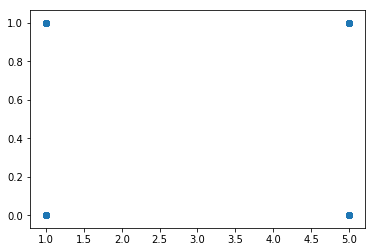

In [452]:
plt.scatter(df12[~df12['Post Type'].isnull()]['split_id'], df12[~df12['Post Type'].isnull()]['Post Type'])
plt.show()

#### From the above chart, looks like the ID and post type are equally distributed. For further analysis, let's check the count grouped by split_id and Post Type.

In [453]:
df12.groupby(['split_id', 'Post Type'])['split_id'].count()

split_id  Post Type
1         0.0          25059
          1.0             15
5         0.0             25
          1.0          10826
Name: split_id, dtype: int64

#### Turns out the majority of Post Type 0 has ID that begins with 1, and the Post Type 1 has the majority of having IDs that begins with 5. Because the correct post type follows what ever shown on ID, and because ID must not be transformed, so we check the minority count value of Post Type to the right Post Type. Post Type 1 with split_id 1 will be replaced with 0, and Post Type 0 with split_id 5 will be replaced by 1.

In [454]:
df12['Post Type'] = df12.apply(lambda row: float(0) if row['Post Type'] == 1 and row['split_id'] == 1 else row['Post Type']
                               ,axis = 1)
df12['Post Type'] = df12.apply(lambda row: float(1) if row['Post Type'] == 0 and row['split_id'] == 5 else row['Post Type']
                               ,axis = 1)

In [455]:
df12.groupby(['split_id', 'Post Type'])['split_id'].count()

split_id  Post Type
1         0.0          25074
5         1.0          10851
Name: split_id, dtype: int64

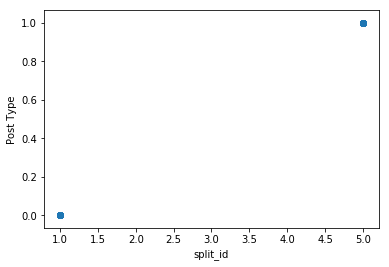

In [456]:
plt.scatter(df12[~df12['Post Type'].isnull()]['split_id'], df12[~df12['Post Type'].isnull()]['Post Type'])
plt.ylabel('Post Type')
plt.xlabel('split_id')
plt.show()

#### The misplaced Post Type has been replaced with the correct value. 
#### Next step we fill the Post Type null values with the same rule as stated above.

In [457]:
df12['Post Type'] = df12.apply(lambda row: float(0) if row['split_id'] == 1 else (float(1) if row['split_id'] == 5 else row['Post Type'])
                              ,axis = 1)

In [458]:
df12[df12['Post Type'].isnull()].shape

(0, 17)

#### Thus there are no more null values is Post Type.
#### To make sure, let's count group by again.

In [459]:
df12.groupby(['split_id', 'Post Type'])['split_id'].count()

split_id  Post Type
1         0.0          25090
5         1.0          10855
Name: split_id, dtype: int64

In [460]:
df12.drop(['split_id'], axis = 1, inplace = True)
df12.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35945 entries, 0 to 35944
Data columns (total 16 columns):
Id                       35945 non-null object
Drone Type               35945 non-null float64
Post Type                35945 non-null float64
Package Weight           35945 non-null float64
Origin Region            35945 non-null float64
Destination Region       35945 non-null float64
Origin Latitude          35945 non-null float64
Origin Longitude         35945 non-null float64
Destination Latitude     35945 non-null float64
Destination Longitude    35945 non-null float64
Journey Distance         35945 non-null float64
Departure Date           35945 non-null object
Departure Time           35945 non-null object
Travel Time              35945 non-null float64
Delivery Time            35945 non-null object
Delivery Fare            35915 non-null float64
dtypes: float64(12), object(4)
memory usage: 4.1+ MB


#### Morning = 1, Afternoon = 2, Night = 3

In [461]:
df13 = df12.copy()

In [462]:
df13['del_rule'] = df13.apply(lambda row: 0 if row['Departure Time'] >= '06:00:00' and row['Departure Time'] < '12:00:00' else
                              (1 if row['Departure Time'] >= '12:00:00' and row['Departure Time'] < '21:00:00' else 2
                              )
                             ,axis = 1)

In [463]:
df13['del_rule'].unique()

array([0, 1, 2], dtype=int64)

In [464]:
not_null = df13[~df13['Delivery Fare'].isnull()]

In [465]:
not_null.shape

(35915, 17)

#### Before making a prediction for Delivery fare, first we have to find what columns are considered as columns that are dependant to the result of Delivery Fare. A few obvious columns are Package Weight, Journey Distance, and Travel Time. We check the relationship for those 3 columns against the Delivery Fare.

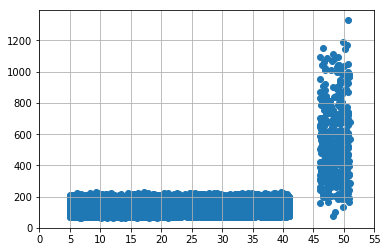

In [466]:
plt.scatter(not_null['Package Weight'], not_null['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.show()

In [467]:
print(not_null[not_null['Package Weight']<45].shape)
print(not_null[not_null['Package Weight']>45].shape)

(35520, 17)
(395, 17)


#### For package weight, package weight that are below 45 have cheaper Fare compared to those who weigh more than 45. Let's check whether each weight has an impact with the Drone Type and Post Type.

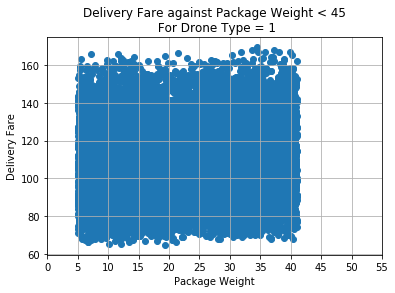

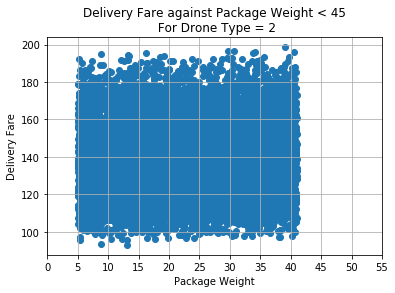

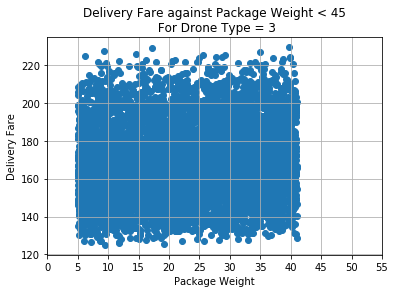

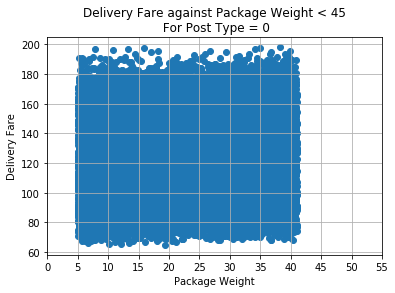

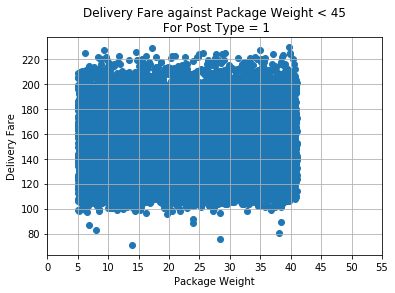

In [468]:
plt.scatter(not_null[(not_null['Package Weight']<45) & (not_null['Drone Type'] == 1)]['Package Weight'], not_null[(not_null['Package Weight']<45) & (not_null['Drone Type'] == 1)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight < 45\n For Drone Type = 1')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']<45) & (not_null['Drone Type'] == 2)]['Package Weight'], not_null[(not_null['Package Weight']<45) & (not_null['Drone Type'] == 2)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight < 45\n For Drone Type = 2')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']<45) & (not_null['Drone Type'] == 3)]['Package Weight'], not_null[(not_null['Package Weight']<45) & (not_null['Drone Type'] == 3)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight < 45\n For Drone Type = 3')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']<45) & (not_null['Post Type'] == 0)]['Package Weight'], not_null[(not_null['Package Weight']<45) & (not_null['Post Type'] == 0)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight < 45\n For Post Type = 0')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']<45) & (not_null['Post Type'] == 1)]['Package Weight'], not_null[(not_null['Package Weight']<45) & (not_null['Post Type'] == 1)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight < 45\n For Post Type = 1')
plt.show()

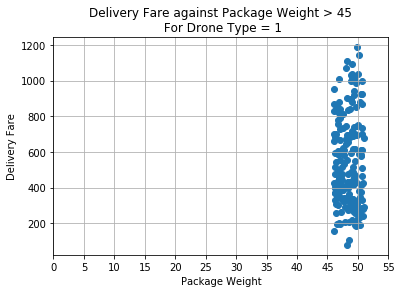

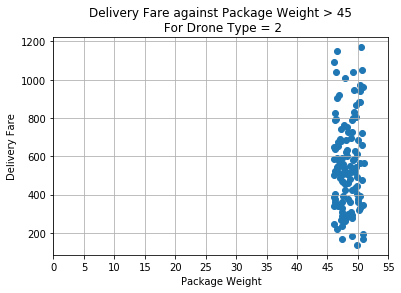

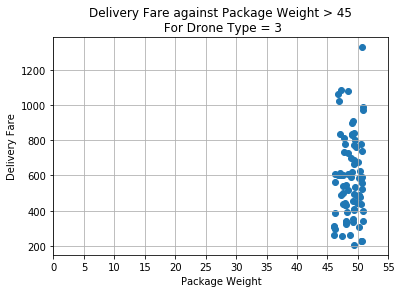

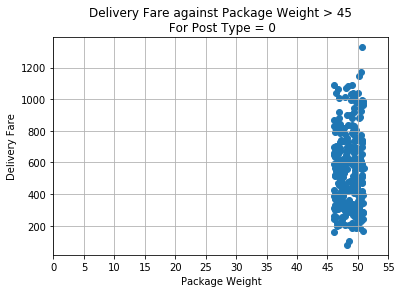

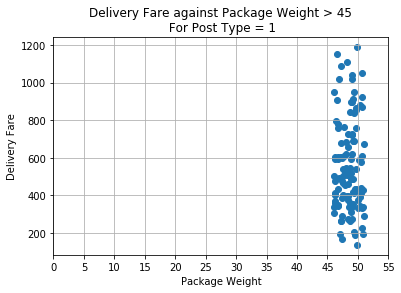

In [469]:
plt.scatter(not_null[(not_null['Package Weight']>45) & (not_null['Drone Type'] == 1)]['Package Weight'], not_null[(not_null['Package Weight']>45) & (not_null['Drone Type'] == 1)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight > 45\n For Drone Type = 1')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']>45) & (not_null['Drone Type'] == 2)]['Package Weight'], not_null[(not_null['Package Weight']>45) & (not_null['Drone Type'] == 2)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight > 45\n For Drone Type = 2')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']>45) & (not_null['Drone Type'] == 3)]['Package Weight'], not_null[(not_null['Package Weight']>45) & (not_null['Drone Type'] == 3)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight > 45\n For Drone Type = 3')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']>45) & (not_null['Post Type'] == 0)]['Package Weight'], not_null[(not_null['Package Weight']>45) & (not_null['Post Type'] == 0)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight > 45\n For Post Type = 0')
plt.show()

plt.scatter(not_null[(not_null['Package Weight']>45) & (not_null['Post Type'] == 1)]['Package Weight'], not_null[(not_null['Package Weight']>45) & (not_null['Post Type'] == 1)]['Delivery Fare'] )
plt.grid()
plt.xticks([x for x in range(0,60,5)])
plt.xlabel('Package Weight')
plt.ylabel('Delivery Fare')
plt.title('Delivery Fare against Package Weight > 45\n For Post Type = 1')
plt.show()

#### There are obvious patterns in Package Weight, such as:
- Drone Type = 1 has max Delivery Fare of around 170
- Drone Type = 2 has max Delivery Fare of around 200
- Drone Type = 3 has max Delivery Fare of around 220

#### Same thing happened with differences in Post Type. The analysis is:
- Post Type = 0 has max Delivery Fare of around 200
- Post Type = 1 has max Delivery Fare of around 220

In conclusion, Package Weight if divided by each Drone Type and Post Type, the higher the Drone Type, and the higher the Post Type, the Delivery Fare maximum value increases.

#### There are some other columns that could be potential for our prediction. Let's try the relationship between Journey DIstance against Delivery Fare, and Travel Time against Delivery Fare.

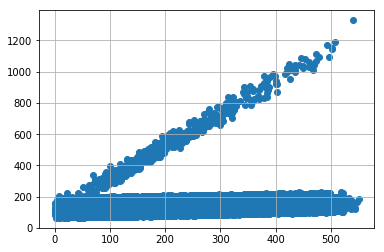

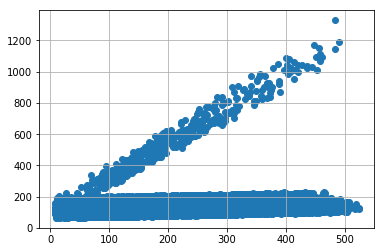

In [470]:
plt.scatter(not_null['Journey Distance'], not_null['Delivery Fare'] )
plt.grid()
plt.show()

plt.scatter(not_null['Travel Time'], not_null['Delivery Fare'] )
plt.grid()
plt.show()

#### Both Travel Time and Journey Distance have similar relationship towards Delivery Fare, thus we take only Journey Distance as one of the predictors because this column has more precise calculation from the given Latitude Longitude.

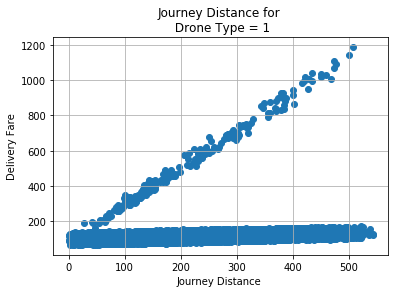

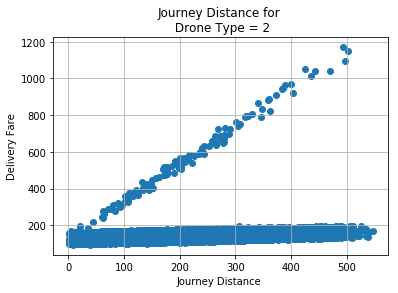

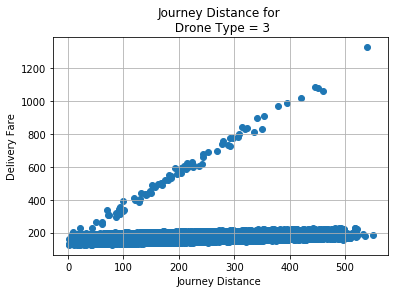

In [471]:
plt.scatter(not_null[not_null['Drone Type'] == 1]['Journey Distance'], not_null[not_null['Drone Type'] == 1]['Delivery Fare'] )
plt.grid()
plt.xlabel('Journey Distance ')
plt.ylabel('Delivery Fare')
plt.title('Journey Distance for \n Drone Type = 1')
plt.show()

plt.scatter(not_null[not_null['Drone Type'] == 2]['Journey Distance'], not_null[not_null['Drone Type'] == 2]['Delivery Fare'] )
plt.grid()
plt.xlabel('Journey Distance ')
plt.ylabel('Delivery Fare')
plt.title('Journey Distance for \n Drone Type = 2')
plt.show()

plt.scatter(not_null[not_null['Drone Type'] == 3]['Journey Distance'], not_null[not_null['Drone Type'] == 3]['Delivery Fare'] )
plt.grid()
plt.xlabel('Journey Distance ')
plt.ylabel('Delivery Fare')
plt.title('Journey Distance for \n Drone Type = 3')
plt.show()

#### From the above plot of Journey Distance, there are not much difference between those 3. Thus we can conclude that Journey Distance does not reflect much to the change of Drone Type. And The relationship is not linear.

#### Next we try the relation between the Journey Distance and Post Type.

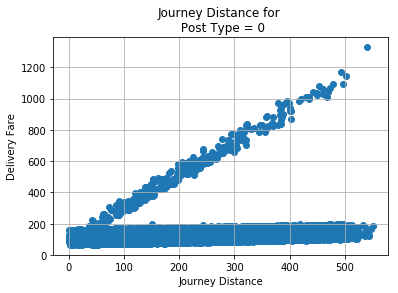

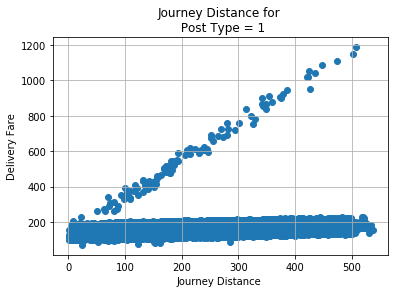

In [472]:
plt.scatter(not_null[not_null['Post Type'] == 0]['Journey Distance'], not_null[not_null['Post Type'] == 0]['Delivery Fare'] )
plt.grid()
plt.xlabel('Journey Distance')
plt.ylabel('Delivery Fare')
plt.title('Journey Distance for \n Post Type = 0')
plt.show()

plt.scatter(not_null[not_null['Post Type'] == 1]['Journey Distance'], not_null[not_null['Post Type'] == 1]['Delivery Fare'] )
plt.grid()
plt.xlabel('Journey Distance ')
plt.ylabel('Delivery Fare')
plt.title('Journey Distance for \n Post Type = 1')
plt.show()

#### Next we check for the relationship of Delivery Rule. Compare with Drone Type and Post Type just like the previous chart.

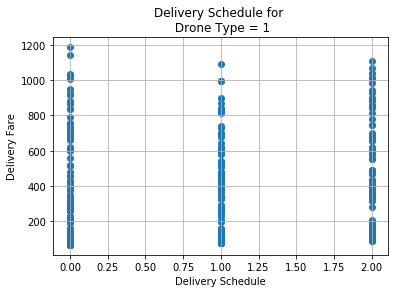

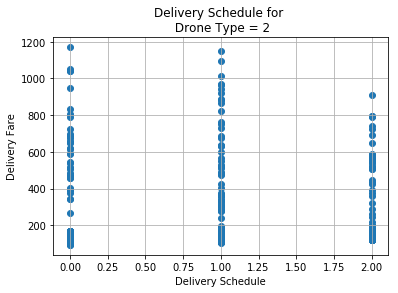

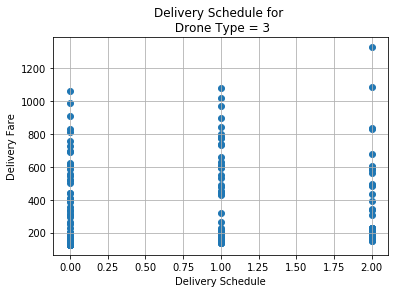

In [473]:
plt.scatter(not_null[not_null['Drone Type'] == 1]['del_rule'], not_null[not_null['Drone Type'] == 1]['Delivery Fare'] )
plt.grid()
plt.xlabel('Delivery Schedule')
plt.ylabel('Delivery Fare')
plt.title('Delivery Schedule for \n Drone Type = 1')
plt.show()

plt.scatter(not_null[not_null['Drone Type'] == 2]['del_rule'], not_null[not_null['Drone Type'] == 2]['Delivery Fare'] )
plt.grid()
plt.xlabel('Delivery Schedule')
plt.ylabel('Delivery Fare')
plt.title('Delivery Schedule for \n Drone Type = 2')
plt.show()

plt.scatter(not_null[not_null['Drone Type'] == 3]['del_rule'], not_null[not_null['Drone Type'] == 3]['Delivery Fare'] )
plt.grid()
plt.xlabel('Delivery Schedule')
plt.ylabel('Delivery Fare')
plt.title('Delivery Schedule for \n Drone Type = 3')
plt.show()

#### For 3 Drone type, the 3 Delivery Schedule are similar to each other, which does not show any significant changes to the Delivery Fare.
#### Next we try Delivery Schedule with each Post Type against Delivery Fare.

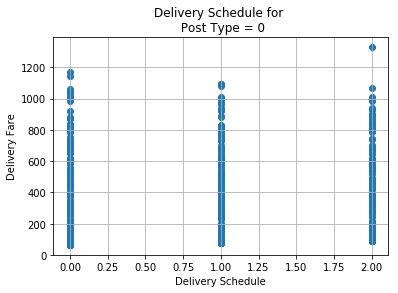

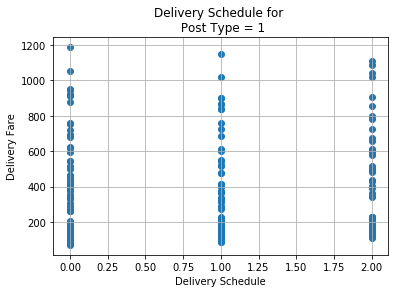

In [474]:
plt.scatter(not_null[not_null['Post Type'] == 0]['del_rule'], not_null[not_null['Post Type'] == 0]['Delivery Fare'] )
plt.grid()
plt.xlabel('Delivery Schedule')
plt.ylabel('Delivery Fare')
plt.title('Delivery Schedule for \n Post Type = 0')
plt.show()

plt.scatter(not_null[not_null['Post Type'] == 1]['del_rule'], not_null[not_null['Post Type'] == 1]['Delivery Fare'] )
plt.grid()
plt.xlabel('Delivery Schedule')
plt.ylabel('Delivery Fare')
plt.title('Delivery Schedule for \n Post Type = 1')
plt.show()

#### Again, for the 2 Post type, the 3 Delivery Schedule are similar to each other, which does not show any significant changes to the Delivery Fare.

In [475]:
X_train, X_test, y_train, y_test = train_test_split(not_null[['Drone Type', 'Post Type', 'Package Weight', 'Journey Distance', 'del_rule']], not_null['Delivery Fare'], random_state = 111)

In [476]:
# list(map(pd.np.shape, [X_train, X_test, y_train, y_test]))

In [477]:
lin_reg = LinearRegression()

In [478]:
lin_reg.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [479]:
print('r-squared for this model = ',lin_reg.score(X_test,y_test))

r-squared for this model =  0.29458936298362937


In [480]:
weight_above = not_null[not_null['Package Weight'] > 45]

In [481]:
weight_above.shape

(395, 17)

In [482]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(weight_above[['Drone Type', 'Post Type', 'Package Weight', 'Journey Distance', 'del_rule']], weight_above['Delivery Fare'], random_state = 111)

In [483]:
lin_reg_1 = LinearRegression()

In [484]:
lin_reg_1.fit(X_train_1,y_train_1)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [485]:
print('r-squared for model with weight > 45 = ',lin_reg_1.score(X_test_1,y_test_1))

r-squared for model with weight > 45 =  0.9990548014652272


In [486]:
weight_below = not_null[not_null['Package Weight'] < 45]

In [487]:
weight_below.shape

(35520, 17)

In [488]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(weight_below[['Drone Type', 'Post Type', 'Package Weight', 'Journey Distance', 'del_rule']], weight_below['Delivery Fare'], random_state = 111)

In [489]:
lin_reg_2 = LinearRegression()

In [490]:
lin_reg_2.fit(X_train_2,y_train_2)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [491]:
print('r-squared for model with weight < 45 = ',lin_reg_2.score(X_test_2,y_test_2))

r-squared for model with weight < 45 =  0.9893092245750439


#### Comparing R-squared value for model with weight < 45 against model with weight > 45. Obviously the r-squared value for weight > 45 is higher than r-squared value for weight < 45. 

#### However, as can be seen from previous graphs regarding the relationship between those two weight values with the Delivery Fare, the package weight < 45 has more significant changes compared to the weight > 45. Thus we can conclude that ONLY rows that have weight < 45 will be used to predict the null  values of Delivery Fare. And rows with weight > 45 will be discarded as those rows will make inconsistency in further analysis. 

In [492]:
df14 = df13[df13['Package Weight'] < 45]

In [493]:
df14.shape

(35550, 17)

In [494]:
df14['Delivery Fare'][df14['Delivery Fare'].isnull()] = lin_reg_2.predict(df14[['Drone Type', 'Post Type', 'Package Weight', 'Journey Distance', 'del_rule']])

In [495]:
df14[df14['Delivery Fare'].isnull()]

,Id,Drone Type,Post Type,Package Weight,Origin Region,Destination Region,Origin Latitude,Origin Longitude,Destination Latitude,Destination Longitude,Journey Distance,Departure Date,Departure Time,Travel Time,Delivery Time,Delivery Fare,del_rule


#### There are no more null values in Delivery Fare after applying a prediction based on the linear regression from weight < 45.

In [496]:
df14.drop(['del_rule'], axis = 1,inplace = True)

In [497]:
# Before
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36005 entries, 0 to 36004
Data columns (total 16 columns):
Id                       35980 non-null object
Drone Type               35995 non-null float64
Post Type                35985 non-null float64
Package Weight           36005 non-null float64
Origin Region            35995 non-null float64
Destination Region       35995 non-null float64
Origin Latitude          36005 non-null float64
Origin Longitude         36005 non-null float64
Destination Latitude     36005 non-null float64
Destination Longitude    36005 non-null float64
Journey Distance         36005 non-null float64
Departure Date           36005 non-null object
Departure Time           36005 non-null object
Travel Time              35965 non-null float64
Delivery Time            36005 non-null object
Delivery Fare            35975 non-null float64
dtypes: float64(12), object(4)
memory usage: 3.8+ MB


In [498]:
# After
df14.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35550 entries, 0 to 35944
Data columns (total 16 columns):
Id                       35550 non-null object
Drone Type               35550 non-null float64
Post Type                35550 non-null float64
Package Weight           35550 non-null float64
Origin Region            35550 non-null float64
Destination Region       35550 non-null float64
Origin Latitude          35550 non-null float64
Origin Longitude         35550 non-null float64
Destination Latitude     35550 non-null float64
Destination Longitude    35550 non-null float64
Journey Distance         35550 non-null float64
Departure Date           35550 non-null object
Departure Time           35550 non-null object
Travel Time              35550 non-null float64
Delivery Time            35550 non-null object
Delivery Fare            35550 non-null float64
dtypes: float64(12), object(4)
memory usage: 4.1+ MB
